## Disclamer: this notebook is messy !!

In [1]:
!pip -q install gdown rasterio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 77.4 MB/s eta 0:00:00:00:0100:01


In [2]:
import os
import cv2
import numpy as np
import pandas as pd
from tqdm import tqdm
import gdown
import rasterio
import matplotlib.pyplot as plt
import math
import random
import seaborn as sns
from sklearn.metrics import confusion_matrix


import torch
from torch import nn, optim
from torch.utils.data import Dataset, DataLoader
import torch.nn.functional as F

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [3]:
data_url = "https://zenodo.org/records/5151941/files/MARIDA.zip?download=1"
data_zip = "marida.zip"
marida_scenes_path = "patches"

In [4]:
gdown.download(data_url, data_zip)

Downloading...
From: https://zenodo.org/records/5151941/files/MARIDA.zip?download=1
To: /kaggle/working/marida.zip
100%|██████████| 1.16G/1.16G [01:27<00:00, 13.3MB/s]


'marida.zip'

In [5]:
!unzip -q marida.zip

In [6]:
len(os.listdir(marida_scenes_path))

63

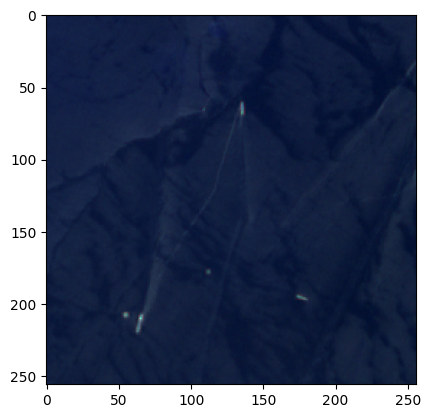

In [8]:
sample_patch = "/kaggle/working/patches/S2_1-12-19_48MYU/S2_1-12-19_48MYU_3.tif"

with rasterio.open(sample_patch) as file:
    data = file.read()

img = np.stack([data[4], data[3], data[2]], axis=-1)
img = (img-img.min())/(img.max()-img.min())
plt.imshow(img)

In [9]:
data.shape

(11, 256, 256)

In [10]:
class MaridaIter():
    def __init__(self, root_path=marida_scenes_path):
        self._root_path = root_path
        self._scenes = sorted(os.listdir(root_path))
        self._scene_idx = 0
        self._patch_idx = 0
        self._len = self._compute_len()

    def _compute_len(self):
        l = 0
        for scene in self._scenes:
            scene_path = os.path.join(self._root_path, scene)
            l += len(os.listdir(scene_path))//3
        return l
    
    def __len__(self):
        return self._len    
    
    def __iter__(self):
        return self


    def __next__(self):
        if self._scene_idx == len(self._scenes):
            self._scene_idx = 0
            self._patch_idx = 0
            raise StopIteration

        self._patch_idx += 1
        scene = self._scenes[self._scene_idx%len(self._scenes)]
        scene_path = os.path.join(self._root_path, scene)

        if self._patch_idx == len(os.listdir(scene_path))//3:
            # last scene, last patch
            self._scene_idx += 1
            self._patch_idx = 0

        image_file = f"{scene}_{self._patch_idx}.tif"
        mask_file = f"{scene}_{self._patch_idx}_cl.tif"
        conf_file = f"{scene}_{self._patch_idx}_conf.tif"
        return [os.path.join(self._root_path, scene, file) for file in [image_file, mask_file, conf_file]]

marida_iter = MaridaIter()

In [11]:
sample_mask = "/kaggle/working/patches/S2_1-12-19_48MYU/S2_1-12-19_48MYU_0_cl.tif"
patches = os.listdir("patches")

class_counts = {i: 0 for i in range(16)}
for image, target, conf in tqdm(marida_iter):
    with rasterio.open(target) as file:
        clss, counts = np.unique(file.read(), return_counts=True)
        for cls, count in zip(clss, counts):
            class_counts[cls] += count

100%|██████████| 1381/1381 [00:04<00:00, 291.86it/s]


In [12]:
class_counts

{0: 89667839,
 1: 3399,
 2: 2797,
 3: 2357,
 4: 864,
 5: 5803,
 6: 117400,
 7: 129159,
 8: 372937,
 9: 1225,
 10: 157612,
 11: 17369,
 12: 5827,
 13: 11728,
 14: 8490,
 15: 410}

In [13]:
classes = {
0: "bg",
1: "Marine Debris",
2: "Dense Sargassum",
3: "Sparse Sargassum",
4: "Natural Organic Material",
5: "Ship",
6: "Clouds",
7: "Marine Water",
8: "Sediment-Laden Water",
9: "Foam",
10: "Turbid Water",
11: "Shallow Water",
12: "Waves",
13: "Cloud Shadows",
14: "Wakes",
15: "Mixed Water",
}

In [14]:
# (from sara from jayash from DeepSeek)
color_mapping = {
    0: (255, 165, 0),    # mystery class - orange
    1: (240, 20, 20),    # Marine Debris - Red
    2: (0, 128, 0),      # Dense Sargassum - Green
    3: (144, 238, 144),  # Sparse Sargassum - Light Green
    4: (139, 69, 19),    # Natural Organic Material - Brown
    5: (128, 128, 128),  # Ship - Gray
    6: (255, 255, 255),  # Clouds - White
    7: (20, 20, 240),    # Marine Water - Blue
    8: (210, 180, 140),  # Sediment-Laden Water - Tan
    9: (255, 255, 220),  # Foam - Light Yellow
    10: (64, 224, 208),  # Turbid Water - Turquoise
    11: (176, 224, 230), # Shallow Water - Powder Blue
    12: (0, 191, 255),   # Waves - Deep Sky Blue
    13: (105, 105, 105), # Cloud Shadows - Dim Gray
    14: (220, 220, 220), # Wakes - Gainsboro
    15: (70, 130, 180)   # Mixed Water - Steel Blue
}

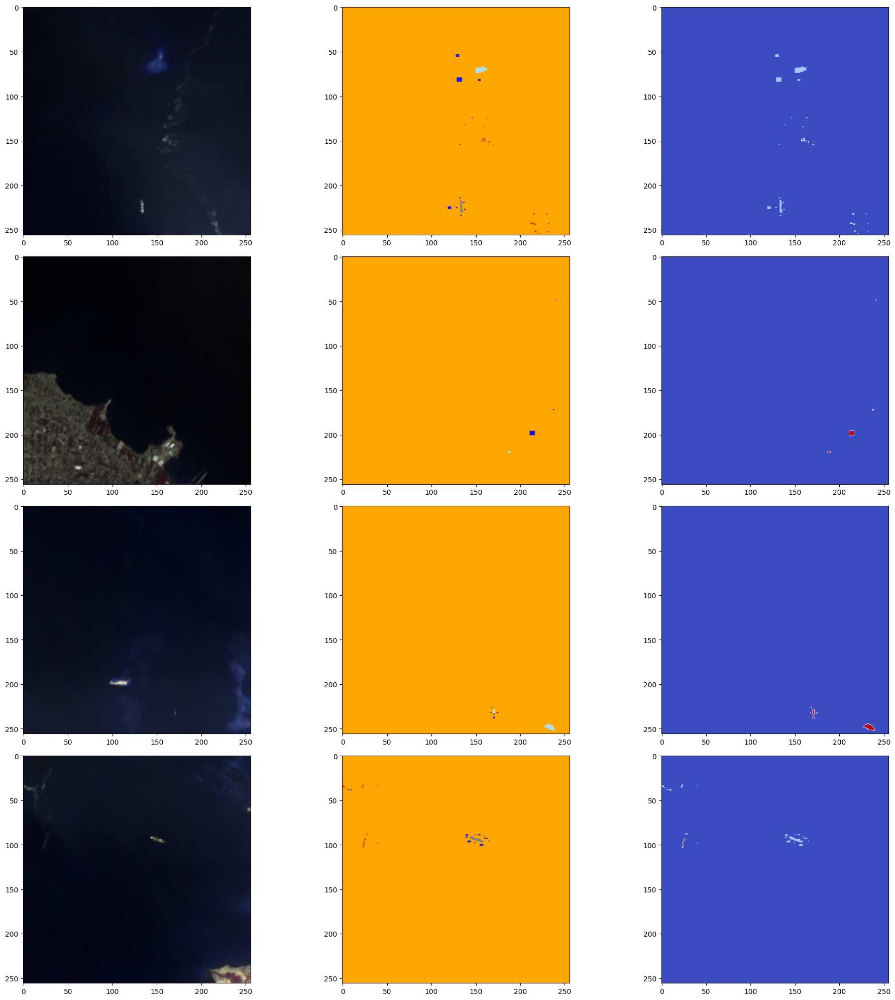

In [15]:
patch_name = os.listdir(marida_scenes_path)[12]
patch_path = os.path.join(marida_scenes_path, patch_name)

num_imgs = min(len(os.listdir(patch_path))//3, 8)

_, axis = plt.subplots(num_imgs, 3, figsize=(20, 20))

for i in range(num_imgs):
    img_file = os.path.join(marida_scenes_path, patch_name, f"{patch_name}_{i}.tif")
    with rasterio.open(img_file) as file:
        img = file.read()

    msk_file = os.path.join(marida_scenes_path, patch_name, f"{patch_name}_{i}_cl.tif")
    with rasterio.open(msk_file) as file:
        msk = file.read()[0]

    cnf_file = os.path.join(marida_scenes_path, patch_name, f"{patch_name}_{i}_conf.tif")
    with rasterio.open(cnf_file) as file:
        cnf = file.read()

    img = np.stack([img[4], img[3], img[2]], axis=-1)
    img = (img-img.min())/(img.max()-img.min())
    
    color_mask = np.zeros((*msk.shape, 3), dtype=np.uint8)
    labels, colors = zip(*color_mapping.items())
    labels = np.array(labels)
    colors = np.array(colors, dtype=np.uint8)
    
    for label, color in zip(labels, colors):
        color_mask[msk == label] = color

    axis[i, 0].imshow(img)
    axis[i, 1].imshow(color_mask)
    axis[i, 2].imshow(cnf[0], cmap="coolwarm")

plt.tight_layout()
plt.show()

0.0
2.0
0.0
5.0
0.0
7.0
4.0
0.0


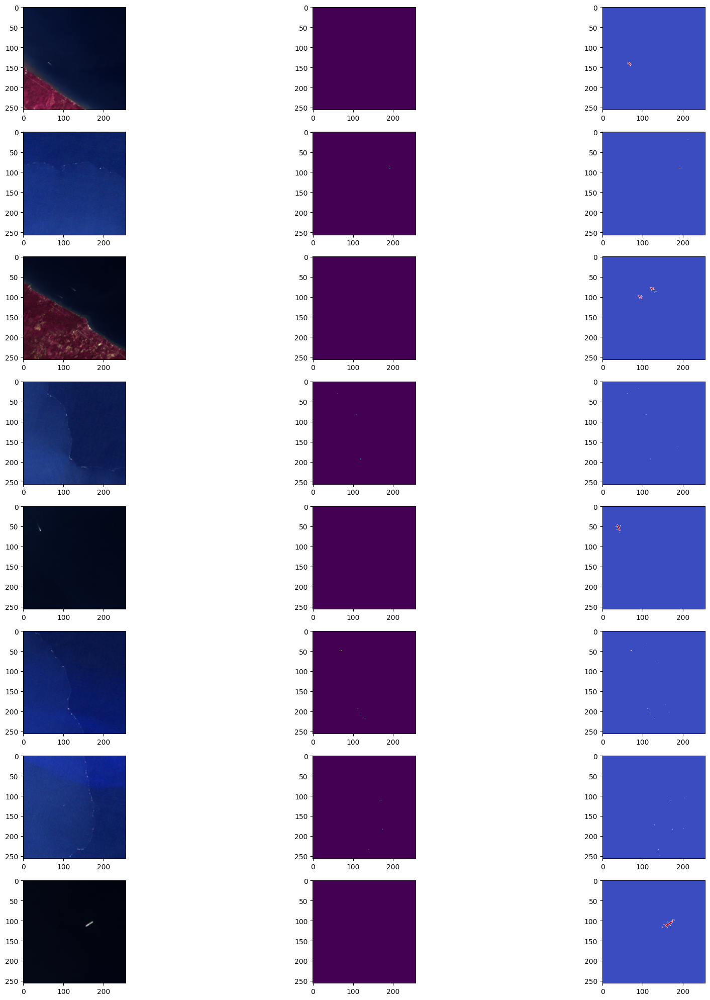

In [16]:
patch_name = os.listdir(marida_scenes_path)[0]
patch_path = os.path.join(marida_scenes_path, patch_name)

num_imgs = min(len(os.listdir(patch_path))//3, 8)

_, axis = plt.subplots(num_imgs, 3, figsize=(20, 20))

for i in range(num_imgs):
    img_file = os.path.join(marida_scenes_path, patch_name, f"{patch_name}_{i}.tif")
    with rasterio.open(img_file) as file:
        img = file.read()

    msk_file = os.path.join(marida_scenes_path, patch_name, f"{patch_name}_{i}_cl.tif")
    with rasterio.open(msk_file) as file:
        msk = file.read()[0]

    cnf_file = os.path.join(marida_scenes_path, patch_name, f"{patch_name}_{i}_conf.tif")
    with rasterio.open(cnf_file) as file:
        cnf = file.read()

    img = np.stack([img[4], img[3], img[2]], axis=-1)
    img = (img-img.min())/(img.max()-img.min())
    
    # color_mask = np.zeros((*msk.shape, 3), dtype=np.uint8)
    # labels, colors = zip(*color_mapping.items())
    # labels = np.array(labels)
    # colors = np.array(colors, dtype=np.uint8)
    
    # for label, color in zip(labels, colors):
    #     color_mask[msk == label] = color
    color_mask = (msk == 1).astype(np.uint8)*255
    print(color_mask.sum()//255)
    axis[i, 0].imshow(img)
    axis[i, 1].imshow(color_mask)
    axis[i, 2].imshow(cnf[0], cmap="coolwarm")

plt.tight_layout()
plt.show()

In [17]:
def minority_chunks(path="patches", chunk_size=64, target_index=1):
    tracker = []
    for scene in tqdm(os.listdir(path)):
        scene_path = os.path.join(path, scene)
        num_patches = len(os.listdir(scene_path)) // 3

        for patch_i in range(num_patches):
            mask_path = os.path.join(scene_path, f"{scene}_{patch_i}_cl.tif")

            with rasterio.open(mask_path) as file:
                mask = file.read()[0]

            num_chunks = mask.shape[0]//chunk_size
            for i in range(num_chunks-1):
                for j in range(num_chunks-1):
                    i_s, i_f = i*chunk_size, (i+1)*chunk_size
                    j_s, j_f = j*chunk_size, (j+1)*chunk_size
                    chunk = mask[i_s:i_f, j_s:j_f]
                    chunk_score = (chunk == 1).sum()
                    tracker.append((chunk_score, scene, patch_i, i_s, i_f, j_s, j_f))
    return tracker

In [18]:
ranks = minority_chunks()

100%|██████████| 63/63 [00:02<00:00, 24.19it/s]


In [19]:
len(ranks)

12429

In [20]:
sorted(ranks, key=lambda x: x[0], reverse=True)[:12]

[(66, 'S2_6-12-18_48MXU', 0, 0, 64, 128, 192),
 (52, 'S2_4-9-16_16PCC', 23, 64, 128, 64, 128),
 (46, 'S2_29-12-20_18QYF', 3, 64, 128, 64, 128),
 (43, 'S2_19-3-20_18QYF', 1, 128, 192, 128, 192),
 (35, 'S2_3-1-21_18QYF', 1, 64, 128, 64, 128),
 (28, 'S2_18-9-20_16PCC', 39, 128, 192, 0, 64),
 (27, 'S2_14-3-20_18QYF', 2, 0, 64, 0, 64),
 (21, 'S2_18-9-20_16PCC', 39, 128, 192, 64, 128),
 (21, 'S2_14-3-20_18QYF', 5, 0, 64, 0, 64),
 (21, 'S2_20-4-18_30VWH', 4, 128, 192, 0, 64),
 (20, 'S2_4-9-16_16PCC', 23, 128, 192, 64, 128),
 (19, 'S2_20-10-20_18QYF', 2, 128, 192, 64, 128)]

In [21]:
class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1)
        self.bn1 = nn.BatchNorm2d(out_channels)
        self.bn2 = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU(inplace=True)

    def forward(self, x):
        x = self.bn1(self.relu(self.conv1(x)))
        return self.bn2(self.relu(self.conv2(x)))

class EncBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.conv = ConvBlock(in_channels, out_channels)
        self.sample = nn.MaxPool2d(2, 2)

    def forward(self, x):
        res_x = self.conv(x)
        return self.sample(res_x), res_x

class DecBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.conv = ConvBlock(in_channels, out_channels)
        self.sample = nn.ConvTranspose2d(in_channels, out_channels, kernel_size=2, stride=2)

    def forward(self, x, res_x):
        x = self.sample(x)
        x = torch.cat([x, res_x], dim=1)
        return self.conv(x)



class UNet(nn.Module):
    def __init__(self, in_channels, num_classes):
        super().__init__()
        self.enc1 = EncBlock(in_channels, 16)
        self.enc2 = EncBlock(16, 32)
        self.enc3 = EncBlock(32, 64)
        self.enc4 = EncBlock(64, 128)

        self.btlnk = nn.Sequential(
            ConvBlock(128, 256),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=1)
        )

        self.dec1 = DecBlock(256, 128)
        self.dec2 = DecBlock(128, 64)
        self.dec3 = DecBlock(64, 32)
        self.dec4 = DecBlock(32, 16)

        self.out = nn.Conv2d(16, num_classes, kernel_size=3, padding=1)
        self.logger = False
    
    def examin(self, x):
        if self.logger:
            print("\n\n\n\n", x.min().item(), x.max().item(), x.mean().item(), x.std().item())

    def forward(self, x):
        x, res1 = self.enc1(x)
        self.examin(x)
        self.examin(res1)

        x, res2 = self.enc2(x)
        self.examin(x)
        self.examin(res2)
        
        x, res3 = self.enc3(x)
        self.examin(x)
        self.examin(res3)
        
        x, res4 = self.enc4(x)
        self.examin(x)
        self.examin(res4)

        x = self.btlnk(x)
        self.examin(x)

        x = self.dec1(x, res4)
        self.examin(x)
        
        x = self.dec2(x, res3)
        self.examin(x)
        
        x = self.dec3(x, res2)
        self.examin(x)
        
        x = self.dec4(x, res1)
        self.examin(x)
        
        return self.out(x)

In [22]:
sample1, sample2 = torch.randn(4, 11, 256, 256), torch.randn(4, 11, 64, 64)
u = UNet(11, 16)
u(sample1).size(), u(sample2).size()

(torch.Size([4, 16, 256, 256]), torch.Size([4, 16, 64, 64]))

In [23]:
sample_patch_path = "patches/S2_1-12-19_48MYU/S2_1-12-19_48MYU_0.tif"
sample_mask_path = "patches/S2_1-12-19_48MYU/S2_1-12-19_48MYU_0_cl.tif"
sample_conf_path = "patches/S2_1-12-19_48MYU/S2_1-12-19_48MYU_0_conf.tif"

In [24]:
def plot_rgb(tif_path):
    with rasterio.open(tif_path) as f:
        red = f.read(4)
        green = f.read(3)
        blue = f.read(2)
        data = np.dstack((red, green, blue))
        data = (data - data.min())/(data.max() - data.min())
        plt.imshow(data)

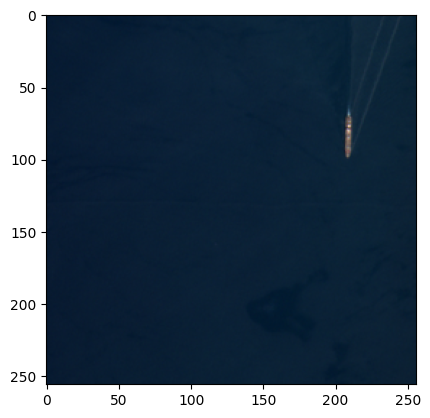

In [25]:
plot_rgb(sample_patch_path)

In [27]:
def train_test_chunks(ranks, marida_iterator, num_best=200, test_size=0.2, num_random_samples=50):
    assert len(ranks) >= num_best+num_random_samples, "no enough patches (for this version of the function)"

    top_ranks = sorted(ranks, key=lambda x: x[0], reverse=True)[:num_best]
    random_samples = random.choices(ranks[num_best:], k=num_random_samples)
    all_samples = top_ranks + random_samples
    all_samples = [sample[1:] for sample in all_samples]
    random.shuffle(all_samples)
    threshold = int(len(all_samples)*test_size)
    return all_samples[threshold:], all_samples[:threshold]

In [28]:
class S2Dataset(Dataset):
    def __init__(self, root_path, samples, num_classes=16):
        self._root_path = root_path
        self._samples = samples
        self.msi = "full_bands"
        self.num_classes = num_classes
       self.class_weights = self._compute_class_weights()

    def _compute_class_weights(self):

        occs_map = {i: 0 for i in range(self.num_classes)}
        for scene, idx, i_s, i_f, j_s, j_f in tqdm(self._samples):
            mask_path = os.path.join(self._root_path, scene, f"{scene}_{idx}_cl.tif")
            with rasterio.open(mask_path) as file:
                mask = (file.read() == 1).astype(np.uint8)
            
            occs_map[1] += (mask==1).sum()
            occs_map[0] += (mask!=1).sum()

        return np.array(list(occs_map[key] for key in sorted(occs_map.keys())))    
    def __len__(self):
        return len(self._samples)

    def _file(self, scene, idx, suffix=""):
        return os.path.join(self._root_path, scene, f"{scene}_{idx}{suffix}.tif")

    def _crop(self, np_arr, i_s, i_f, j_s, j_f):
        return np_arr[..., i_s:i_f, j_s:j_f]
    
    def __getitem__(self, idx):
        scene, idx, *coords = self._samples[idx]
        image_file = self._file(scene, idx)
        mask_file = self._file(scene, idx, "_cl")
        conf_file = self._file(scene, idx, "_conf")
        with rasterio.open(image_file) as file:
            image = file.read()

        with rasterio.open(mask_file) as file:
            mask = (file.read()[0] == 1).astype(np.uint8)
        
        with rasterio.open(conf_file) as file:
            conf = file.read()[0]

        return image, mask, conf
        # return self._crop(image, *coords), self._crop(mask, *coords), self._crop(conf, *coords)

In [29]:
train_samples, test_samples = train_test_chunks(ranks, MaridaIter(), num_best=400, test_size=0.2, num_random_samples=128)

In [30]:
train_samples[0]

('S2_7-3-20_18QYG', 12, 128, 192, 0, 64)

In [31]:
train_dataset = S2Dataset(marida_scenes_path, train_samples, num_classes=2)
test_dataset = S2Dataset(marida_scenes_path, test_samples, num_classes=2)

100%|██████████| 105/105 [00:00<00:00, 522.30it/s]


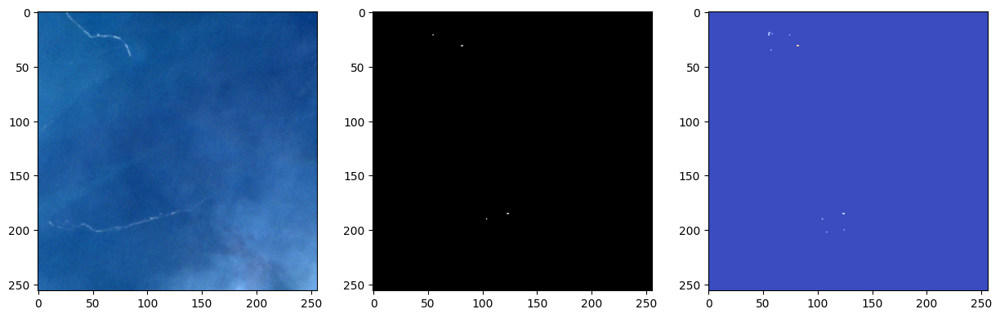

In [32]:
img, msk, cnf = train_dataset[12]

rgb_img = np.dstack((img[3], img[2], img[1]))
rgb_img = (rgb_img - rgb_img.min()) / (rgb_img.max() - rgb_img.min())

fig, axis = plt.subplots(1, 3, figsize=(15, 5))

axis[0].imshow(rgb_img)
axis[1].imshow(msk, cmap="gray")
axis[2].imshow(cnf, cmap="coolwarm")

In [33]:
train_dataset.class_weights, train_dataset.num_classes

(array([27717639,     4089]), 2)

In [48]:
model = UNet(11, train_dataset.num_classes).to(device)

In [49]:
img.shape, msk.shape, cnf.shape

((11, 256, 256), (256, 256), (256, 256))

In [51]:
batch_size=8
train_loader = DataLoader(train_dataset, shuffle=True, num_workers=os.cpu_count(), batch_size=batch_size)
test_loader = DataLoader(test_dataset, num_workers=os.cpu_count(), batch_size=batch_size)

In [52]:

median_w = np.sum(train_dataset.class_weights) / train_dataset.num_classes
class_weights = median_w / train_dataset.class_weights
class_weights = torch.tensor(class_weights, dtype=torch.float32, device=device)
class_weights[0] *= 50
# class_weights = F.softmax(class_weights+class_weights.std(), dim=0)
class_weights /= class_weights.sum()

In [53]:
class_weights

tensor([0.0073, 0.9927], device='cuda:0')

In [54]:
epochs = 160

total_steps = len(train_loader)*epochs
warmup_steps = int(.04*total_steps)
learning_rate = 8e-4
eta_min_ratio = .005

def lr_lambda(current_step):
    if current_step < warmup_steps:
        return current_step / max(1, warmup_steps)
    else:
        progress = (current_step - warmup_steps) / max(1, total_steps - warmup_steps)
        return eta_min_ratio + (1 - eta_min_ratio) * 0.5 * (1 + math.cos(math.pi * progress))


optimizer = optim.AdamW(model.parameters(), lr=learning_rate, weight_decay=1e-2)
scheduler = optim.lr_scheduler.LambdaLR(optimizer, lr_lambda=lr_lambda)
# criterion = nn.CrossEntropyLoss(weight=class_weights, reduction="mean", label_smoothing=1e-2)

original_weights = class_weights.clone().detach()




def DiceLoss(pred, target, smooth=1e-6):
    pred = (pred.argmax(1)==1).float()
    intersection = (pred * target).sum(dim=(1, 2))
    union = (pred.sum(dim=(1, 2)) + target.sum(dim=(1, 2)))
    dice = 2*intersection / (union+smooth)
    return 1 - dice.mean()


class FocalLoss(nn.Module):
    def __init__(self, alpha=1., gamma=2., reduction="mean"):
        super().__init__()
        self.alpha = alpha
        self.gamma = gamma 
        self.reduction = reduction

    def forward(self, pred, target):
        ce_loss = F.cross_entropy(pred, target, reduction="none")

        p = torch.softmax(pred, dim=1)
        p = p.gather(1, target.unsqueeze(1)).squeeze(1)

        focal_loss = self.alpha * (1 - p) ** self.gamma * ce_loss

        return focal_loss.mean() + .5*DiceLoss(pred, target)
            
criterion = FocalLoss()

In [55]:
original_weights

tensor([0.0073, 0.9927], device='cuda:0')

epoch 1/160: 100%|██████████| 53/53 [00:06<00:00,  8.73it/s, lr=0.000125, loss=0.703]

epoch [1/160]: loss: 0.09212382


val_loss: nan, val_f1: 0.03227581, val_dice: 0.00002645, val_iou: 0.00001323, val_precision: 0.00953704, val_recall: 0.05594171


epoch 2/160: 100%|██████████| 53/53 [00:06<00:00,  8.75it/s, lr=0.00025, loss=0.67]  

epoch [2/160]: loss: 0.08566516


val_loss: nan, val_f1: 0.03178517, val_dice: 0.00003807, val_iou: 0.00001904, val_precision: 0.00954285, val_recall: 0.04544812


epoch 3/160: 100%|██████████| 53/53 [00:06<00:00,  8.76it/s, lr=0.000375, loss=0.629]

epoch [3/160]: loss: 0.08164825


val_loss: nan, val_f1: 0.02885740, val_dice: 0.00025346, val_iou: 0.00012698, val_precision: 0.00965153, val_recall: 0.02293090


epoch 4/160: 100%|██████████| 53/53 [00:06<00:00,  8.73it/s, lr=0.0005, loss=0.547]  

epoch [4/160]: loss: 0.07314310


val_loss: nan, val_f1: 0.05060590, val_dice: 0.00086131, val_iou: 0.00043881, val_precision: 0.01117542, val_recall: 0.00327956


epoch 5/160: 100%|██████████| 53/53 [00:06<00:00,  8.64it/s, lr=0.000625, loss=0.507]

epoch [5/160]: loss: 0.06551597


val_loss: nan, val_f1: 0.04761905, val_dice: 0.00000000, val_iou: 0.00000000, val_precision: 0.05714286, val_recall: 0.00000000


epoch 6/160: 100%|██████████| 53/53 [00:06<00:00,  8.53it/s, lr=0.00075, loss=0.504] 

epoch [6/160]: loss: 0.06339167


val_loss: nan, val_f1: 0.00902404, val_dice: 0.00088137, val_iou: 0.00045534, val_precision: 0.08724054, val_recall: 0.00074365


epoch 7/160: 100%|██████████| 53/53 [00:06<00:00,  8.57it/s, lr=0.0008, loss=0.502]  

epoch [7/160]: loss: 0.06282437


val_loss: nan, val_f1: 0.01408743, val_dice: 0.00109513, val_iou: 0.00057232, val_precision: 0.08709553, val_recall: 0.00117655


epoch 8/160: 100%|██████████| 53/53 [00:06<00:00,  8.59it/s, lr=0.0008, loss=0.502]

epoch [8/160]: loss: 0.06269993


val_loss: nan, val_f1: 0.02998516, val_dice: 0.00169451, val_iou: 0.00090421, val_precision: 0.07799892, val_recall: 0.00167605


epoch 9/160: 100%|██████████| 53/53 [00:06<00:00,  8.54it/s, lr=0.000799, loss=0.501]

epoch [9/160]: loss: 0.06255151


val_loss: nan, val_f1: 0.04077931, val_dice: 0.00296213, val_iou: 0.00157816, val_precision: 0.06303201, val_recall: 0.00247427


epoch 10/160: 100%|██████████| 53/53 [00:06<00:00,  8.61it/s, lr=0.000799, loss=0.501]

epoch [10/160]: loss: 0.06182950


val_loss: nan, val_f1: 0.05942446, val_dice: 0.00498355, val_iou: 0.00264180, val_precision: 0.05456895, val_recall: 0.00425027


epoch 11/160: 100%|██████████| 53/53 [00:06<00:00,  8.72it/s, lr=0.000798, loss=0.501]

epoch [11/160]: loss: 0.06116639


val_loss: nan, val_f1: 0.09684467, val_dice: 0.00899633, val_iou: 0.00488643, val_precision: 0.06232633, val_recall: 0.00636074


epoch 12/160: 100%|██████████| 53/53 [00:06<00:00,  8.71it/s, lr=0.000797, loss=0.501]

epoch [12/160]: loss: 0.06051265


val_loss: nan, val_f1: 0.13305265, val_dice: 0.01099656, val_iou: 0.00598795, val_precision: 0.06864021, val_recall: 0.01727377


epoch 13/160: 100%|██████████| 53/53 [00:06<00:00,  8.67it/s, lr=0.000796, loss=0.5]  

epoch [13/160]: loss: 0.06015626


val_loss: nan, val_f1: 0.16117877, val_dice: 0.01486840, val_iou: 0.00837361, val_precision: 0.05114001, val_recall: 0.01141208


epoch 14/160: 100%|██████████| 53/53 [00:06<00:00,  8.67it/s, lr=0.000795, loss=0.5]  

epoch [14/160]: loss: 0.05974856


val_loss: nan, val_f1: 0.23367981, val_dice: 0.01952852, val_iou: 0.01127259, val_precision: 0.05108212, val_recall: 0.02827079


epoch 15/160: 100%|██████████| 53/53 [00:06<00:00,  8.66it/s, lr=0.000794, loss=0.449]

epoch [15/160]: loss: 0.05850445


val_loss: nan, val_f1: 0.21428561, val_dice: 0.01785058, val_iou: 0.01026953, val_precision: 0.05216853, val_recall: 0.02377556


epoch 16/160: 100%|██████████| 53/53 [00:06<00:00,  8.66it/s, lr=0.000792, loss=0.47] 

epoch [16/160]: loss: 0.05905358


val_loss: nan, val_f1: 0.21804492, val_dice: 0.01762329, val_iou: 0.01004858, val_precision: 0.07103565, val_recall: 0.02348271


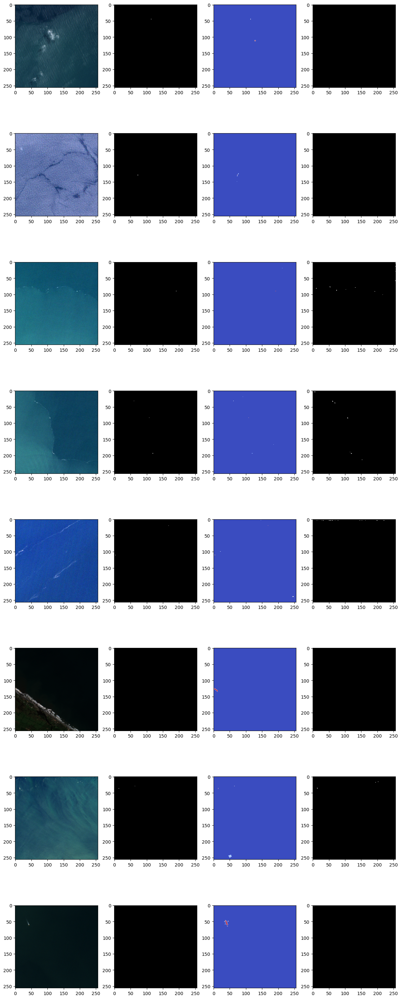

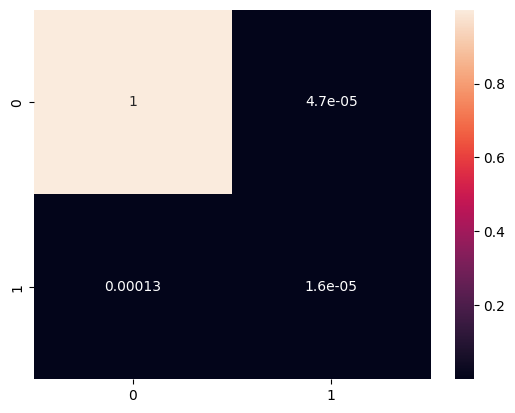

epoch 17/160: 100%|██████████| 53/53 [00:06<00:00,  8.65it/s, lr=0.000791, loss=0.467]

epoch [17/160]: loss: 0.05863486


val_loss: nan, val_f1: 0.21406860, val_dice: 0.01865784, val_iou: 0.01060119, val_precision: 0.06177258, val_recall: 0.02448885


epoch 18/160: 100%|██████████| 53/53 [00:06<00:00,  8.69it/s, lr=0.000789, loss=0.478]

epoch [18/160]: loss: 0.05792038


val_loss: nan, val_f1: 0.21166483, val_dice: 0.01868704, val_iou: 0.01057830, val_precision: 0.05003317, val_recall: 0.02552482


epoch 19/160: 100%|██████████| 53/53 [00:06<00:00,  8.62it/s, lr=0.000787, loss=0.48] 

epoch [19/160]: loss: 0.05691009


val_loss: nan, val_f1: 0.25061337, val_dice: 0.02377871, val_iou: 0.01386113, val_precision: 0.05389442, val_recall: 0.02967480


epoch 20/160: 100%|██████████| 53/53 [00:06<00:00,  8.55it/s, lr=0.000785, loss=0.471]

epoch [20/160]: loss: 0.05722204


val_loss: nan, val_f1: 0.23745775, val_dice: 0.02320837, val_iou: 0.01334834, val_precision: 0.06103125, val_recall: 0.02778959


epoch 21/160: 100%|██████████| 53/53 [00:06<00:00,  8.64it/s, lr=0.000782, loss=0.434]

epoch [21/160]: loss: 0.05613501


val_loss: nan, val_f1: 0.30796430, val_dice: 0.03120487, val_iou: 0.01872902, val_precision: 0.05390907, val_recall: 0.03855645


epoch 22/160: 100%|██████████| 53/53 [00:06<00:00,  8.67it/s, lr=0.00078, loss=0.485] 

epoch [22/160]: loss: 0.05691966


val_loss: nan, val_f1: 0.24440044, val_dice: 0.02415795, val_iou: 0.01389630, val_precision: 0.05810665, val_recall: 0.02928475


epoch 23/160: 100%|██████████| 53/53 [00:06<00:00,  8.61it/s, lr=0.000777, loss=0.437]

epoch [23/160]: loss: 0.05626095


val_loss: nan, val_f1: 0.30822281, val_dice: 0.03057894, val_iou: 0.01820249, val_precision: 0.06017660, val_recall: 0.03624178


epoch 24/160: 100%|██████████| 53/53 [00:06<00:00,  8.53it/s, lr=0.000774, loss=0.476]

epoch [24/160]: loss: 0.05484858


val_loss: nan, val_f1: 0.18956881, val_dice: 0.01715996, val_iou: 0.00962565, val_precision: 0.08322248, val_recall: 0.02067473


epoch 25/160: 100%|██████████| 53/53 [00:06<00:00,  8.65it/s, lr=0.000772, loss=0.482]

epoch [25/160]: loss: 0.05527158


val_loss: nan, val_f1: 0.31023969, val_dice: 0.03176223, val_iou: 0.01923442, val_precision: 0.06055122, val_recall: 0.02806573


epoch 26/160: 100%|██████████| 53/53 [00:06<00:00,  8.66it/s, lr=0.000768, loss=0.424]

epoch [26/160]: loss: 0.05591922


val_loss: nan, val_f1: 0.24731433, val_dice: 0.02312594, val_iou: 0.01314608, val_precision: 0.07585716, val_recall: 0.02707843


epoch 27/160: 100%|██████████| 53/53 [00:06<00:00,  8.60it/s, lr=0.000765, loss=0.492]

epoch [27/160]: loss: 0.05491721


val_loss: nan, val_f1: 0.29218966, val_dice: 0.02762246, val_iou: 0.01602240, val_precision: 0.06105756, val_recall: 0.03494973


epoch 28/160: 100%|██████████| 53/53 [00:06<00:00,  8.56it/s, lr=0.000762, loss=0.426]

epoch [28/160]: loss: 0.05417402


val_loss: nan, val_f1: 0.38560360, val_dice: 0.04014132, val_iou: 0.02510713, val_precision: 0.05727793, val_recall: 0.05189035


epoch 29/160: 100%|██████████| 53/53 [00:06<00:00,  8.65it/s, lr=0.000758, loss=0.381]

epoch [29/160]: loss: 0.05378048


val_loss: nan, val_f1: 0.37564240, val_dice: 0.03904883, val_iou: 0.02430294, val_precision: 0.05468665, val_recall: 0.04335871


epoch 30/160: 100%|██████████| 53/53 [00:06<00:00,  8.66it/s, lr=0.000755, loss=0.387]

epoch [30/160]: loss: 0.05421105


val_loss: nan, val_f1: 0.39834748, val_dice: 0.04145255, val_iou: 0.02586956, val_precision: 0.06089254, val_recall: 0.05124522


epoch 31/160: 100%|██████████| 53/53 [00:06<00:00,  8.61it/s, lr=0.000751, loss=0.259]

epoch [31/160]: loss: 0.05197391


val_loss: nan, val_f1: 0.36172210, val_dice: 0.03715436, val_iou: 0.02268040, val_precision: 0.07207161, val_recall: 0.04134049


epoch 32/160: 100%|██████████| 53/53 [00:06<00:00,  8.60it/s, lr=0.000747, loss=0.372]

epoch [32/160]: loss: 0.05359817


val_loss: nan, val_f1: 0.37648527, val_dice: 0.04013054, val_iou: 0.02516945, val_precision: 0.05406140, val_recall: 0.04413680


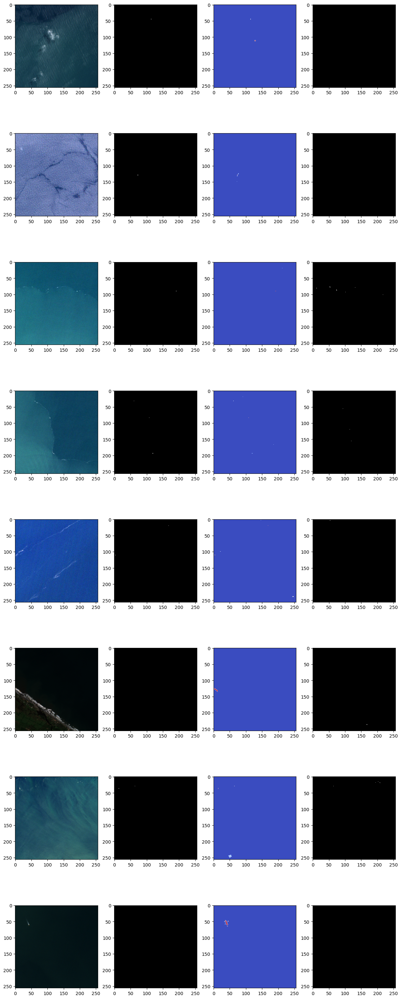

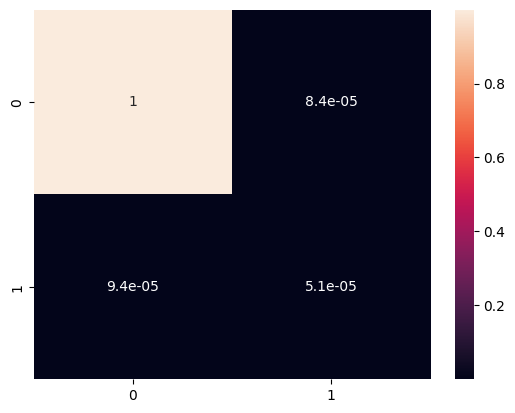

epoch 33/160: 100%|██████████| 53/53 [00:06<00:00,  8.64it/s, lr=0.000743, loss=0.315]

epoch [33/160]: loss: 0.05323267


val_loss: nan, val_f1: 0.35475459, val_dice: 0.03582947, val_iou: 0.02183388, val_precision: 0.05927881, val_recall: 0.04354355


epoch 34/160: 100%|██████████| 53/53 [00:06<00:00,  8.60it/s, lr=0.000738, loss=0.474]

epoch [34/160]: loss: 0.05270990


val_loss: nan, val_f1: 0.42390092, val_dice: 0.04307470, val_iou: 0.02780187, val_precision: 0.06328826, val_recall: 0.04569869


epoch 35/160: 100%|██████████| 53/53 [00:06<00:00,  8.63it/s, lr=0.000734, loss=0.413]

epoch [35/160]: loss: 0.05173196


val_loss: nan, val_f1: 0.33832663, val_dice: 0.03633746, val_iou: 0.02221563, val_precision: 0.08077072, val_recall: 0.03643164


epoch 36/160: 100%|██████████| 53/53 [00:06<00:00,  8.60it/s, lr=0.000729, loss=0.433]

epoch [36/160]: loss: 0.05096606


val_loss: nan, val_f1: 0.42898660, val_dice: 0.04620599, val_iou: 0.02995662, val_precision: 0.06570516, val_recall: 0.05222415


epoch 37/160: 100%|██████████| 53/53 [00:06<00:00,  8.63it/s, lr=0.000725, loss=0.44] 

epoch [37/160]: loss: 0.05102148


val_loss: nan, val_f1: 0.23110314, val_dice: 0.02367572, val_iou: 0.01354344, val_precision: 0.09670438, val_recall: 0.02407243


epoch 38/160: 100%|██████████| 53/53 [00:06<00:00,  8.58it/s, lr=0.00072, loss=0.414] 

epoch [38/160]: loss: 0.04949923


val_loss: nan, val_f1: 0.38040688, val_dice: 0.04206338, val_iou: 0.02623320, val_precision: 0.08672095, val_recall: 0.04001114


epoch 39/160: 100%|██████████| 53/53 [00:06<00:00,  8.66it/s, lr=0.000715, loss=0.348]

epoch [39/160]: loss: 0.04792940


val_loss: nan, val_f1: 0.51383388, val_dice: 0.05748485, val_iou: 0.03902335, val_precision: 0.06655264, val_recall: 0.07293740


epoch 40/160: 100%|██████████| 53/53 [00:06<00:00,  8.60it/s, lr=0.00071, loss=0.408] 

epoch [40/160]: loss: 0.04726316


val_loss: nan, val_f1: 0.48118856, val_dice: 0.05424161, val_iou: 0.03639179, val_precision: 0.07447580, val_recall: 0.05874720


epoch 41/160: 100%|██████████| 53/53 [00:06<00:00,  8.64it/s, lr=0.000704, loss=0.361]

epoch [41/160]: loss: 0.04615509


val_loss: nan, val_f1: 0.42227486, val_dice: 0.04694239, val_iou: 0.03032318, val_precision: 0.09241477, val_recall: 0.04390898


epoch 42/160: 100%|██████████| 53/53 [00:06<00:00,  8.39it/s, lr=0.000699, loss=0.247]

epoch [42/160]: loss: 0.04574311


val_loss: nan, val_f1: 0.53333650, val_dice: 0.06053847, val_iou: 0.04196058, val_precision: 0.08556901, val_recall: 0.06170360


epoch 43/160: 100%|██████████| 53/53 [00:06<00:00,  8.66it/s, lr=0.000694, loss=0.5]  

epoch [43/160]: loss: 0.04468684


val_loss: nan, val_f1: 0.52665084, val_dice: 0.06045294, val_iou: 0.04181833, val_precision: 0.08712078, val_recall: 0.06147406


epoch 44/160: 100%|██████████| 53/53 [00:06<00:00,  8.60it/s, lr=0.000688, loss=0.367]

epoch [44/160]: loss: 0.04315510


val_loss: nan, val_f1: 0.53575654, val_dice: 0.05997856, val_iou: 0.04143927, val_precision: 0.09113001, val_recall: 0.06009237


epoch 45/160: 100%|██████████| 53/53 [00:06<00:00,  8.66it/s, lr=0.000682, loss=0.352]

epoch [45/160]: loss: 0.04315729


val_loss: nan, val_f1: 0.60701698, val_dice: 0.06944221, val_iou: 0.05032803, val_precision: 0.07812802, val_recall: 0.08161454


epoch 46/160: 100%|██████████| 53/53 [00:06<00:00,  8.60it/s, lr=0.000676, loss=0.28] 

epoch [46/160]: loss: 0.04279408


val_loss: nan, val_f1: 0.59565505, val_dice: 0.06937870, val_iou: 0.05025279, val_precision: 0.08694094, val_recall: 0.07424304


epoch 47/160: 100%|██████████| 53/53 [00:06<00:00,  8.66it/s, lr=0.00067, loss=0.398] 

epoch [47/160]: loss: 0.04198652


val_loss: nan, val_f1: 0.53797273, val_dice: 0.06051687, val_iou: 0.04200147, val_precision: 0.08638873, val_recall: 0.06254967


epoch 48/160: 100%|██████████| 53/53 [00:06<00:00,  8.62it/s, lr=0.000664, loss=0.352]

epoch [48/160]: loss: 0.04743275


val_loss: nan, val_f1: 0.53170603, val_dice: 0.05887399, val_iou: 0.04009292, val_precision: 0.06711266, val_recall: 0.07866558


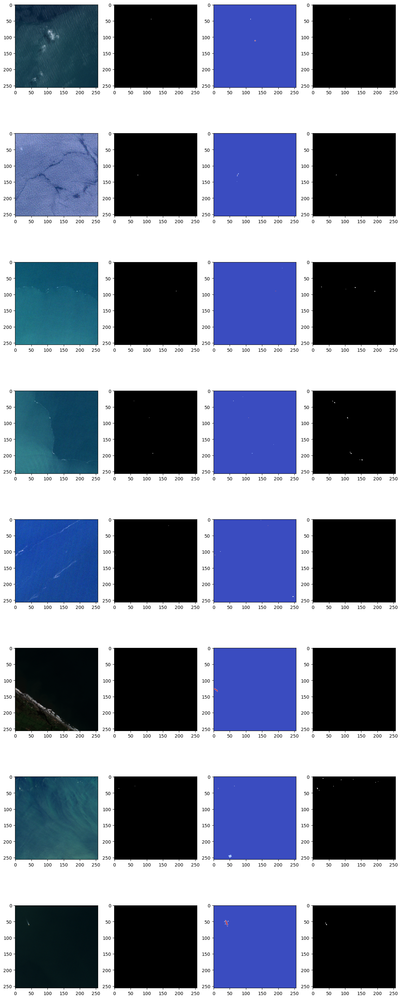

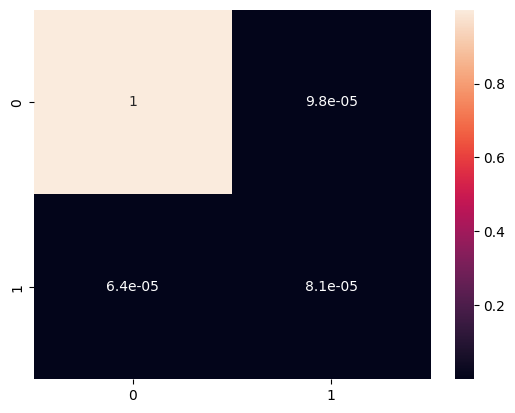

epoch 49/160: 100%|██████████| 53/53 [00:06<00:00,  8.69it/s, lr=0.000658, loss=0.313]

epoch [49/160]: loss: 0.04380234


val_loss: nan, val_f1: 0.53172639, val_dice: 0.05861456, val_iou: 0.03995874, val_precision: 0.09452530, val_recall: 0.05621051


epoch 50/160: 100%|██████████| 53/53 [00:06<00:00,  8.67it/s, lr=0.000652, loss=0.246]

epoch [50/160]: loss: 0.04103004


val_loss: nan, val_f1: 0.63305496, val_dice: 0.07314675, val_iou: 0.05398020, val_precision: 0.08420995, val_recall: 0.08292292


epoch 51/160: 100%|██████████| 53/53 [00:06<00:00,  8.62it/s, lr=0.000646, loss=0.22] 

epoch [51/160]: loss: 0.03767912


val_loss: nan, val_f1: 0.62704800, val_dice: 0.07283261, val_iou: 0.05380389, val_precision: 0.08382262, val_recall: 0.08300368


epoch 52/160: 100%|██████████| 53/53 [00:06<00:00,  8.54it/s, lr=0.000639, loss=0.36] 

epoch [52/160]: loss: 0.04079787


val_loss: nan, val_f1: 0.60478785, val_dice: 0.06898798, val_iou: 0.04976166, val_precision: 0.08555026, val_recall: 0.07492667


epoch 53/160: 100%|██████████| 53/53 [00:06<00:00,  8.56it/s, lr=0.000632, loss=0.166]

epoch [53/160]: loss: 0.03772087


val_loss: nan, val_f1: 0.67020417, val_dice: 0.07796343, val_iou: 0.05970461, val_precision: 0.09158562, val_recall: 0.08463556


epoch 54/160: 100%|██████████| 53/53 [00:06<00:00,  8.63it/s, lr=0.000626, loss=0.311]

epoch [54/160]: loss: 0.03477114


val_loss: nan, val_f1: 0.66256768, val_dice: 0.07626401, val_iou: 0.05759738, val_precision: 0.09846562, val_recall: 0.07746220


epoch 55/160: 100%|██████████| 53/53 [00:06<00:00,  8.68it/s, lr=0.000619, loss=0.302]

epoch [55/160]: loss: 0.03689311


val_loss: nan, val_f1: 0.59658554, val_dice: 0.06791753, val_iou: 0.04895198, val_precision: 0.09972749, val_recall: 0.06509853


epoch 56/160: 100%|██████████| 53/53 [00:06<00:00,  8.60it/s, lr=0.000612, loss=0.296]

epoch [56/160]: loss: 0.03715181


val_loss: nan, val_f1: 0.67254641, val_dice: 0.07797489, val_iou: 0.05999006, val_precision: 0.08627838, val_recall: 0.09045699


epoch 57/160: 100%|██████████| 53/53 [00:06<00:00,  8.60it/s, lr=0.000605, loss=0.172]

epoch [57/160]: loss: 0.03425599


val_loss: nan, val_f1: 0.70236371, val_dice: 0.08059660, val_iou: 0.06268987, val_precision: 0.10419650, val_recall: 0.08202012


epoch 58/160: 100%|██████████| 53/53 [00:06<00:00,  8.70it/s, lr=0.000598, loss=0.342]

epoch [58/160]: loss: 0.03099644


val_loss: nan, val_f1: 0.75302935, val_dice: 0.08713371, val_iou: 0.07083474, val_precision: 0.10560411, val_recall: 0.09132440


epoch 59/160: 100%|██████████| 53/53 [00:06<00:00,  8.63it/s, lr=0.000591, loss=0.0825]

epoch [59/160]: loss: 0.03019360


val_loss: nan, val_f1: 0.75775659, val_dice: 0.08773580, val_iou: 0.07162025, val_precision: 0.09849355, val_recall: 0.09768189


epoch 60/160: 100%|██████████| 53/53 [00:06<00:00,  8.69it/s, lr=0.000584, loss=0.195]

epoch [60/160]: loss: 0.03035647


val_loss: nan, val_f1: 0.74538488, val_dice: 0.08714355, val_iou: 0.07043641, val_precision: 0.10300299, val_recall: 0.09077021


epoch 61/160: 100%|██████████| 53/53 [00:06<00:00,  8.65it/s, lr=0.000577, loss=0.322]

epoch [61/160]: loss: 0.03066587


val_loss: nan, val_f1: 0.75645131, val_dice: 0.08713544, val_iou: 0.07096405, val_precision: 0.09072212, val_recall: 0.10520084


epoch 62/160: 100%|██████████| 53/53 [00:06<00:00,  8.68it/s, lr=0.000569, loss=0.246] 

epoch [62/160]: loss: 0.02857216


val_loss: nan, val_f1: 0.77888030, val_dice: 0.09045451, val_iou: 0.07548592, val_precision: 0.10290530, val_recall: 0.09809904


epoch 63/160: 100%|██████████| 53/53 [00:06<00:00,  8.65it/s, lr=0.000562, loss=0.259]

epoch [63/160]: loss: 0.02613596


val_loss: nan, val_f1: 0.78008544, val_dice: 0.09061643, val_iou: 0.07552076, val_precision: 0.10649346, val_recall: 0.09634430


epoch 64/160: 100%|██████████| 53/53 [00:06<00:00,  8.68it/s, lr=0.000554, loss=0.113] 

epoch [64/160]: loss: 0.02436587


val_loss: nan, val_f1: 0.74334559, val_dice: 0.08689215, val_iou: 0.07077330, val_precision: 0.09153823, val_recall: 0.10306137


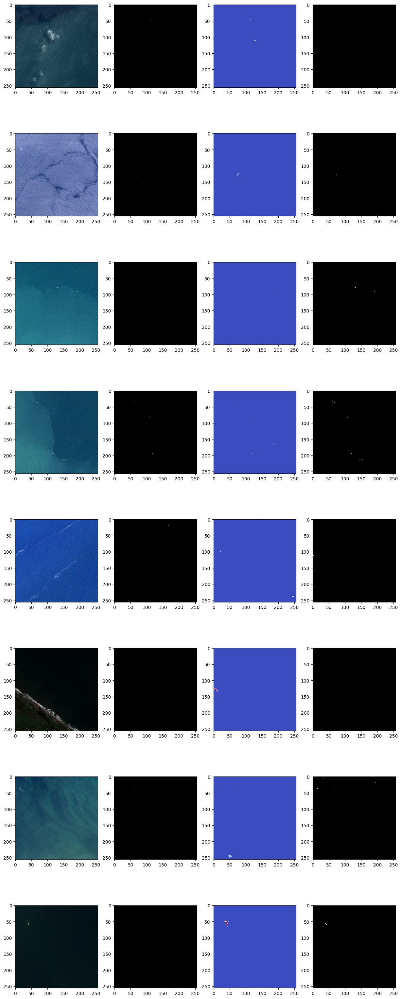

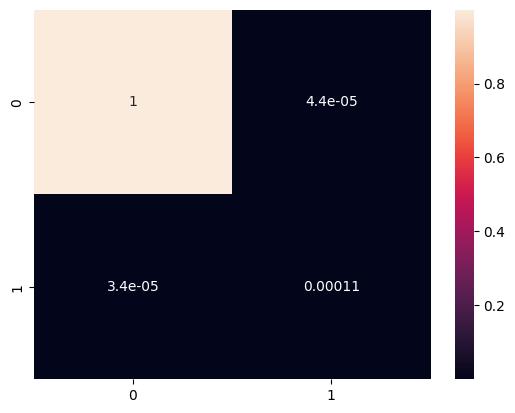

epoch 65/160: 100%|██████████| 53/53 [00:06<00:00,  8.64it/s, lr=0.000547, loss=0.266] 

epoch [65/160]: loss: 0.02862350


val_loss: nan, val_f1: 0.74004896, val_dice: 0.08581234, val_iou: 0.06989667, val_precision: 0.09067000, val_recall: 0.10220233


epoch 66/160: 100%|██████████| 53/53 [00:06<00:00,  8.63it/s, lr=0.000539, loss=0.162] 

epoch [66/160]: loss: 0.02533273


val_loss: nan, val_f1: 0.78735086, val_dice: 0.09261045, val_iou: 0.07818947, val_precision: 0.10639579, val_recall: 0.09836977


epoch 67/160: 100%|██████████| 53/53 [00:06<00:00,  8.63it/s, lr=0.000531, loss=0.303] 

epoch [67/160]: loss: 0.02354520


val_loss: nan, val_f1: 0.79036853, val_dice: 0.09346571, val_iou: 0.07973570, val_precision: 0.10271265, val_recall: 0.10361617


epoch 68/160: 100%|██████████| 53/53 [00:06<00:00,  8.56it/s, lr=0.000524, loss=0.0888]

epoch [68/160]: loss: 0.02490265


val_loss: nan, val_f1: 0.80251749, val_dice: 0.09478823, val_iou: 0.08172949, val_precision: 0.10755845, val_recall: 0.10119650


epoch 69/160: 100%|██████████| 53/53 [00:06<00:00,  8.60it/s, lr=0.000516, loss=0.198] 

epoch [69/160]: loss: 0.02286445


val_loss: nan, val_f1: 0.77579424, val_dice: 0.09054695, val_iou: 0.07547618, val_precision: 0.11435451, val_recall: 0.08878608


epoch 70/160: 100%|██████████| 53/53 [00:06<00:00,  8.62it/s, lr=0.000508, loss=0.156] 

epoch [70/160]: loss: 0.02150210


val_loss: nan, val_f1: 0.80662632, val_dice: 0.09479148, val_iou: 0.08158487, val_precision: 0.10457038, val_recall: 0.10428581


epoch 71/160: 100%|██████████| 53/53 [00:06<00:00,  8.64it/s, lr=0.0005, loss=0.409]   

epoch [71/160]: loss: 0.02224387


val_loss: nan, val_f1: 0.80756784, val_dice: 0.09472425, val_iou: 0.08166990, val_precision: 0.11289538, val_recall: 0.09743874


epoch 72/160: 100%|██████████| 53/53 [00:06<00:00,  8.62it/s, lr=0.000492, loss=0.223] 

epoch [72/160]: loss: 0.02154602


val_loss: nan, val_f1: 0.81565454, val_dice: 0.09599172, val_iou: 0.08344626, val_precision: 0.11241362, val_recall: 0.09928068


epoch 73/160: 100%|██████████| 53/53 [00:06<00:00,  8.65it/s, lr=0.000484, loss=0.189]  

epoch [73/160]: loss: 0.02006475


val_loss: nan, val_f1: 0.82631575, val_dice: 0.09721280, val_iou: 0.08498433, val_precision: 0.10658417, val_recall: 0.10741851


epoch 74/160: 100%|██████████| 53/53 [00:06<00:00,  8.66it/s, lr=0.000476, loss=0.233] 

epoch [74/160]: loss: 0.02018043


val_loss: nan, val_f1: 0.82232470, val_dice: 0.09554595, val_iou: 0.08323250, val_precision: 0.11247735, val_recall: 0.10063614


epoch 75/160: 100%|██████████| 53/53 [00:06<00:00,  8.53it/s, lr=0.000468, loss=0.161] 

epoch [75/160]: loss: 0.01981571


val_loss: nan, val_f1: 0.79951452, val_dice: 0.09374288, val_iou: 0.08039465, val_precision: 0.11006236, val_recall: 0.09816708


epoch 76/160: 100%|██████████| 53/53 [00:06<00:00,  8.59it/s, lr=0.00046, loss=0.365]  

epoch [76/160]: loss: 0.02156790


val_loss: nan, val_f1: 0.79668328, val_dice: 0.09383201, val_iou: 0.07964860, val_precision: 0.11015184, val_recall: 0.09746684


epoch 77/160: 100%|██████████| 53/53 [00:06<00:00,  8.57it/s, lr=0.000452, loss=0.291] 

epoch [77/160]: loss: 0.02233613


val_loss: nan, val_f1: 0.78631052, val_dice: 0.09055729, val_iou: 0.07661711, val_precision: 0.09588750, val_recall: 0.10872792


epoch 78/160: 100%|██████████| 53/53 [00:06<00:00,  8.65it/s, lr=0.000444, loss=0.185] 

epoch [78/160]: loss: 0.02257819


val_loss: nan, val_f1: 0.80444417, val_dice: 0.09531840, val_iou: 0.08199203, val_precision: 0.10601956, val_recall: 0.10291023


epoch 79/160: 100%|██████████| 53/53 [00:06<00:00,  8.62it/s, lr=0.000436, loss=0.171]  

epoch [79/160]: loss: 0.02057200


val_loss: nan, val_f1: 0.84671370, val_dice: 0.09936735, val_iou: 0.08830994, val_precision: 0.11239399, val_recall: 0.10568703


epoch 80/160: 100%|██████████| 53/53 [00:06<00:00,  8.58it/s, lr=0.000428, loss=0.167] 

epoch [80/160]: loss: 0.01942577


val_loss: nan, val_f1: 0.82617291, val_dice: 0.09659247, val_iou: 0.08441273, val_precision: 0.10612910, val_recall: 0.10700636


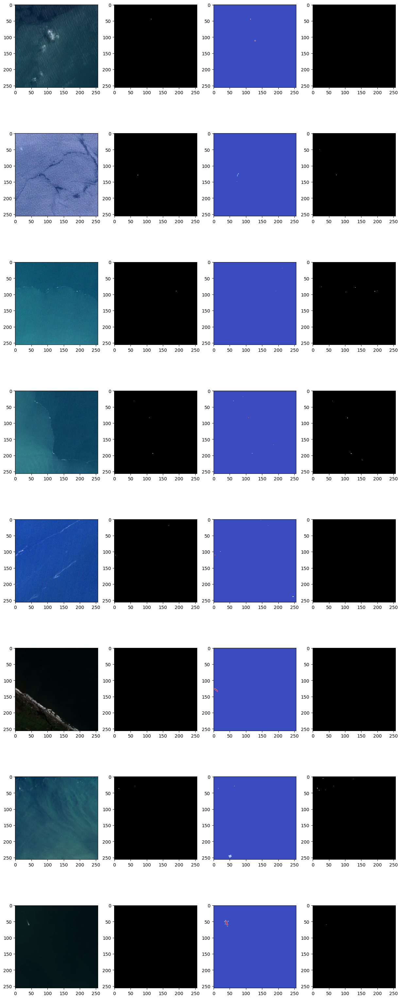

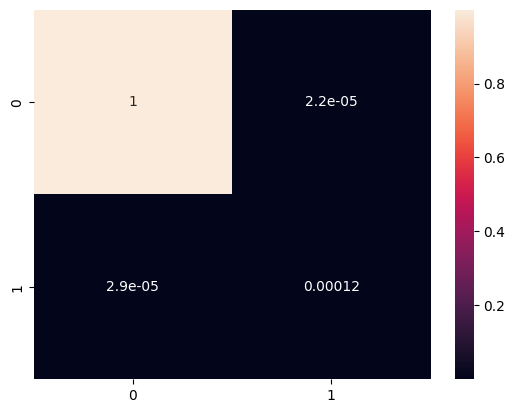

epoch 81/160: 100%|██████████| 53/53 [00:06<00:00,  8.59it/s, lr=0.00042, loss=0.167]  

epoch [81/160]: loss: 0.01874476


val_loss: nan, val_f1: 0.84047307, val_dice: 0.09857291, val_iou: 0.08728080, val_precision: 0.10939874, val_recall: 0.10658293


epoch 82/160: 100%|██████████| 53/53 [00:06<00:00,  8.64it/s, lr=0.000412, loss=0.29]   

epoch [82/160]: loss: 0.01790334


val_loss: nan, val_f1: 0.82789739, val_dice: 0.09691002, val_iou: 0.08495172, val_precision: 0.10631944, val_recall: 0.10800642


epoch 83/160: 100%|██████████| 53/53 [00:06<00:00,  8.44it/s, lr=0.000404, loss=0.143] 

epoch [83/160]: loss: 0.01831937


val_loss: nan, val_f1: 0.74235816, val_dice: 0.08466982, val_iou: 0.06780150, val_precision: 0.11636615, val_recall: 0.08190678


epoch 84/160: 100%|██████████| 53/53 [00:06<00:00,  8.55it/s, lr=0.000395, loss=0.219] 

epoch [84/160]: loss: 0.02014576


val_loss: nan, val_f1: 0.82131109, val_dice: 0.09680881, val_iou: 0.08475233, val_precision: 0.11251320, val_recall: 0.10064863


epoch 85/160: 100%|██████████| 53/53 [00:06<00:00,  8.58it/s, lr=0.000387, loss=0.122] 

epoch [85/160]: loss: 0.01883610


val_loss: nan, val_f1: 0.81232171, val_dice: 0.09639105, val_iou: 0.08409691, val_precision: 0.10442950, val_recall: 0.10782455


epoch 86/160: 100%|██████████| 53/53 [00:06<00:00,  8.59it/s, lr=0.000379, loss=0.183]  

epoch [86/160]: loss: 0.01881442


val_loss: nan, val_f1: 0.82186711, val_dice: 0.09715105, val_iou: 0.08560796, val_precision: 0.10794207, val_recall: 0.10600422


epoch 87/160: 100%|██████████| 53/53 [00:06<00:00,  8.59it/s, lr=0.000371, loss=0.294]  

epoch [87/160]: loss: 0.01819915


val_loss: nan, val_f1: 0.83675184, val_dice: 0.09906296, val_iou: 0.08767097, val_precision: 0.11590724, val_recall: 0.10154433


epoch 88/160: 100%|██████████| 53/53 [00:06<00:00,  8.57it/s, lr=0.000363, loss=0.0757]

epoch [88/160]: loss: 0.01717325


val_loss: nan, val_f1: 0.85110601, val_dice: 0.10070959, val_iou: 0.09071011, val_precision: 0.11534718, val_recall: 0.10600723


epoch 89/160: 100%|██████████| 53/53 [00:06<00:00,  8.65it/s, lr=0.000355, loss=0.31]   

epoch [89/160]: loss: 0.01687583


val_loss: nan, val_f1: 0.85758778, val_dice: 0.10115406, val_iou: 0.09089307, val_precision: 0.11500177, val_recall: 0.10673330


epoch 90/160: 100%|██████████| 53/53 [00:06<00:00,  8.52it/s, lr=0.000347, loss=0.0308] 

epoch [90/160]: loss: 0.01634995


val_loss: nan, val_f1: 0.85763625, val_dice: 0.10150236, val_iou: 0.09144809, val_precision: 0.11513249, val_recall: 0.10725005


epoch 91/160: 100%|██████████| 53/53 [00:06<00:00,  8.63it/s, lr=0.000339, loss=0.106]  

epoch [91/160]: loss: 0.01594875


val_loss: nan, val_f1: 0.86568045, val_dice: 0.10195522, val_iou: 0.09245235, val_precision: 0.11491274, val_recall: 0.10872391


epoch 92/160: 100%|██████████| 53/53 [00:06<00:00,  8.58it/s, lr=0.000331, loss=0.0735] 

epoch [92/160]: loss: 0.01624878


val_loss: nan, val_f1: 0.85097737, val_dice: 0.10135945, val_iou: 0.09110115, val_precision: 0.11921146, val_recall: 0.10293272


epoch 93/160: 100%|██████████| 53/53 [00:06<00:00,  8.64it/s, lr=0.000323, loss=0.099] 

epoch [93/160]: loss: 0.01981258


val_loss: nan, val_f1: 0.82691575, val_dice: 0.09743933, val_iou: 0.08487372, val_precision: 0.12173412, val_recall: 0.09514184


epoch 94/160: 100%|██████████| 53/53 [00:06<00:00,  8.50it/s, lr=0.000315, loss=0.0807] 

epoch [94/160]: loss: 0.01987342


val_loss: nan, val_f1: 0.83560339, val_dice: 0.09871281, val_iou: 0.08682448, val_precision: 0.10942563, val_recall: 0.10684632


epoch 95/160: 100%|██████████| 53/53 [00:06<00:00,  8.60it/s, lr=0.000307, loss=0.0927]

epoch [95/160]: loss: 0.01918711


val_loss: nan, val_f1: 0.85482245, val_dice: 0.10110087, val_iou: 0.09064678, val_precision: 0.11760720, val_recall: 0.10401503


epoch 96/160: 100%|██████████| 53/53 [00:06<00:00,  8.63it/s, lr=0.000299, loss=0.013]  

epoch [96/160]: loss: 0.01678015


val_loss: nan, val_f1: 0.84555346, val_dice: 0.09881561, val_iou: 0.08769267, val_precision: 0.10831748, val_recall: 0.10948016


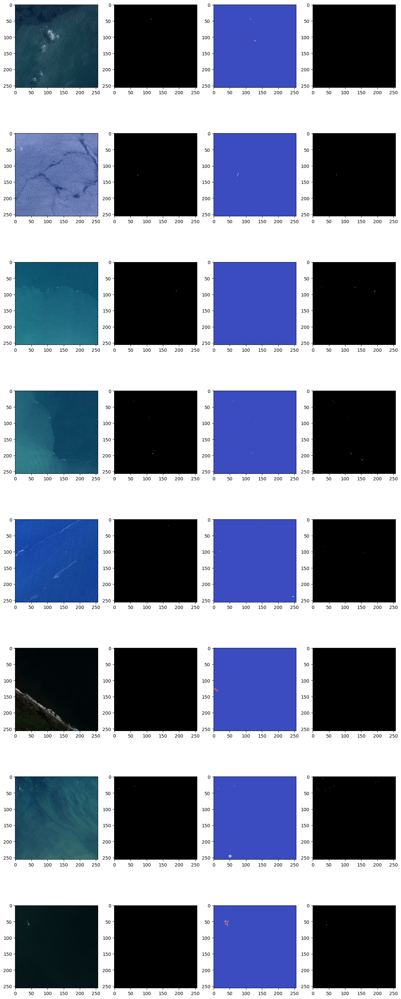

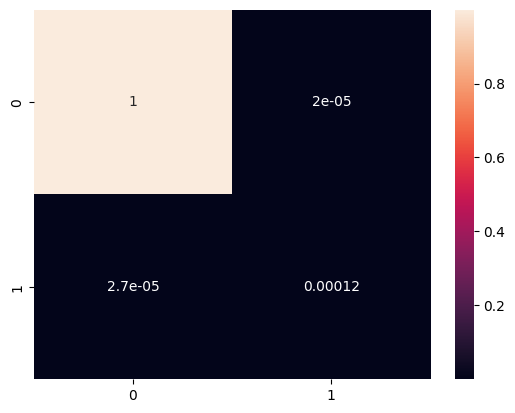

epoch 97/160: 100%|██████████| 53/53 [00:06<00:00,  8.55it/s, lr=0.000291, loss=0.0747] 

epoch [97/160]: loss: 0.01765267


val_loss: nan, val_f1: 0.83791928, val_dice: 0.09878540, val_iou: 0.08737692, val_precision: 0.10941879, val_recall: 0.10804648


epoch 98/160: 100%|██████████| 53/53 [00:06<00:00,  8.66it/s, lr=0.000283, loss=0.214]   

epoch [98/160]: loss: 0.01691647


val_loss: nan, val_f1: 0.85341495, val_dice: 0.10133804, val_iou: 0.09012354, val_precision: 0.11599845, val_recall: 0.10455292


epoch 99/160: 100%|██████████| 53/53 [00:06<00:00,  8.63it/s, lr=0.000276, loss=0.112]  

epoch [99/160]: loss: 0.01692130


val_loss: nan, val_f1: 0.84148073, val_dice: 0.09935030, val_iou: 0.08771362, val_precision: 0.11882693, val_recall: 0.10006392


epoch 100/160: 100%|██████████| 53/53 [00:06<00:00,  8.59it/s, lr=0.000268, loss=0.0714] 

epoch [100/160]: loss: 0.01694722


val_loss: nan, val_f1: 0.86813008, val_dice: 0.10256957, val_iou: 0.09278343, val_precision: 0.11588743, val_recall: 0.10791159


epoch 101/160: 100%|██████████| 53/53 [00:06<00:00,  8.36it/s, lr=0.00026, loss=0.146]   

epoch [101/160]: loss: 0.01676913


val_loss: nan, val_f1: 0.86434572, val_dice: 0.10213891, val_iou: 0.09241795, val_precision: 0.11525810, val_recall: 0.10822004


epoch 102/160: 100%|██████████| 53/53 [00:06<00:00,  8.67it/s, lr=0.000253, loss=0.0949] 

epoch [102/160]: loss: 0.01571134


val_loss: nan, val_f1: 0.85571288, val_dice: 0.10219412, val_iou: 0.09171512, val_precision: 0.11292262, val_recall: 0.10944652


epoch 103/160: 100%|██████████| 53/53 [00:06<00:00,  8.63it/s, lr=0.000245, loss=0.0714] 

epoch [103/160]: loss: 0.01566483


val_loss: nan, val_f1: 0.87491469, val_dice: 0.10319133, val_iou: 0.09376384, val_precision: 0.11793487, val_recall: 0.10787674


epoch 104/160: 100%|██████████| 53/53 [00:06<00:00,  8.54it/s, lr=0.000238, loss=0.289] 

epoch [104/160]: loss: 0.01583636


val_loss: nan, val_f1: 0.86594180, val_dice: 0.10287485, val_iou: 0.09306081, val_precision: 0.11561765, val_recall: 0.10894061


epoch 105/160: 100%|██████████| 53/53 [00:06<00:00,  8.63it/s, lr=0.00023, loss=0.0737]  

epoch [105/160]: loss: 0.01515732


val_loss: nan, val_f1: 0.87678715, val_dice: 0.10394162, val_iou: 0.09493147, val_precision: 0.11744700, val_recall: 0.10945406


epoch 106/160: 100%|██████████| 53/53 [00:06<00:00,  8.65it/s, lr=0.000223, loss=0.143]  

epoch [106/160]: loss: 0.01560925


val_loss: nan, val_f1: 0.88097448, val_dice: 0.10437674, val_iou: 0.09570787, val_precision: 0.11909240, val_recall: 0.10876819


epoch 107/160: 100%|██████████| 53/53 [00:06<00:00,  8.58it/s, lr=0.000216, loss=0.286]  

epoch [107/160]: loss: 0.01539245


val_loss: nan, val_f1: 0.87755842, val_dice: 0.10428216, val_iou: 0.09517896, val_precision: 0.11814834, val_recall: 0.10892740


epoch 108/160: 100%|██████████| 53/53 [00:06<00:00,  8.51it/s, lr=0.000209, loss=0.371]  

epoch [108/160]: loss: 0.01534916


val_loss: nan, val_f1: 0.86783215, val_dice: 0.10273370, val_iou: 0.09326898, val_precision: 0.11462658, val_recall: 0.10987375


epoch 109/160: 100%|██████████| 53/53 [00:06<00:00,  8.62it/s, lr=0.000202, loss=0.215]  

epoch [109/160]: loss: 0.01504529


val_loss: nan, val_f1: 0.87548539, val_dice: 0.10366948, val_iou: 0.09491684, val_precision: 0.11763723, val_recall: 0.10910007


epoch 110/160: 100%|██████████| 53/53 [00:06<00:00,  8.67it/s, lr=0.000195, loss=0.0741] 

epoch [110/160]: loss: 0.01516193


val_loss: nan, val_f1: 0.87769257, val_dice: 0.10396017, val_iou: 0.09511602, val_precision: 0.11719773, val_recall: 0.10975567


epoch 111/160: 100%|██████████| 53/53 [00:06<00:00,  8.60it/s, lr=0.000188, loss=0.357]  

epoch [111/160]: loss: 0.01530456


val_loss: nan, val_f1: 0.88106396, val_dice: 0.10475744, val_iou: 0.09619585, val_precision: 0.11900189, val_recall: 0.10931964


epoch 112/160: 100%|██████████| 53/53 [00:06<00:00,  8.47it/s, lr=0.000181, loss=0.214]  

epoch [112/160]: loss: 0.01518214


val_loss: nan, val_f1: 0.88272253, val_dice: 0.10461335, val_iou: 0.09626138, val_precision: 0.11975100, val_recall: 0.10873454


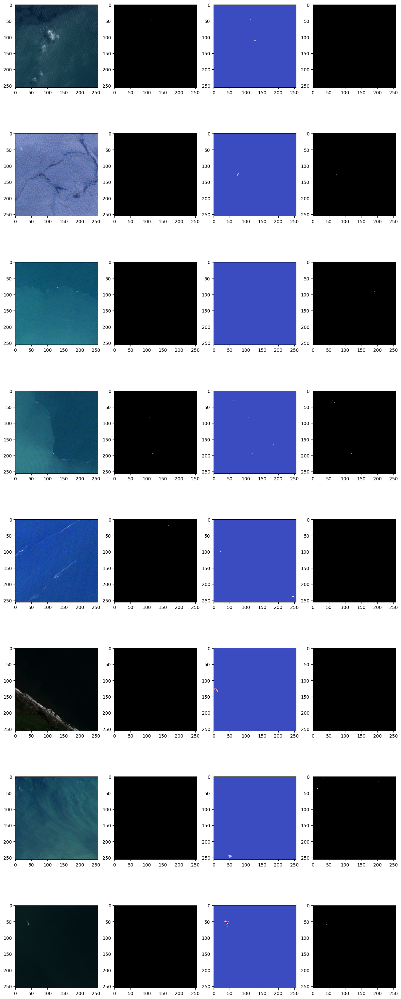

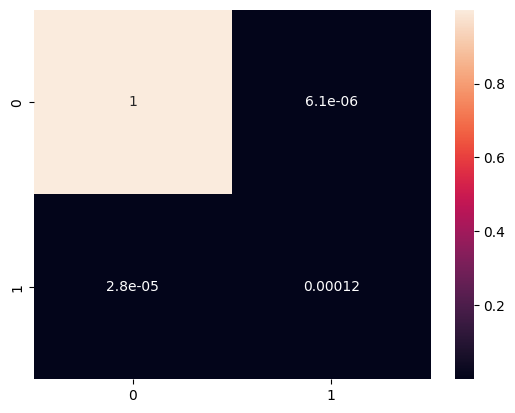

epoch 113/160: 100%|██████████| 53/53 [00:06<00:00,  8.62it/s, lr=0.000174, loss=0.143]  

epoch [113/160]: loss: 0.01527662


val_loss: nan, val_f1: 0.87089014, val_dice: 0.10228539, val_iou: 0.09329758, val_precision: 0.11708352, val_recall: 0.10779317


epoch 114/160: 100%|██████████| 53/53 [00:06<00:00,  8.63it/s, lr=0.000168, loss=0.238]  

epoch [114/160]: loss: 0.01563561


val_loss: nan, val_f1: 0.86315612, val_dice: 0.10254098, val_iou: 0.09273304, val_precision: 0.11483633, val_recall: 0.10927246


epoch 115/160: 100%|██████████| 53/53 [00:06<00:00,  8.56it/s, lr=0.000161, loss=0.0714] 

epoch [115/160]: loss: 0.01542201


val_loss: nan, val_f1: 0.87535585, val_dice: 0.10417445, val_iou: 0.09536828, val_precision: 0.11923758, val_recall: 0.10813587


epoch 116/160: 100%|██████████| 53/53 [00:06<00:00,  8.58it/s, lr=0.000155, loss=0.214]   

epoch [116/160]: loss: 0.01500748


val_loss: nan, val_f1: 0.87979903, val_dice: 0.10394467, val_iou: 0.09507141, val_precision: 0.11821953, val_recall: 0.10900577


epoch 117/160: 100%|██████████| 53/53 [00:06<00:00,  8.64it/s, lr=0.000148, loss=0.0714] 

epoch [117/160]: loss: 0.01512250


val_loss: nan, val_f1: 0.87968709, val_dice: 0.10422384, val_iou: 0.09558651, val_precision: 0.11877341, val_recall: 0.10889461


epoch 118/160: 100%|██████████| 53/53 [00:06<00:00,  8.68it/s, lr=0.000142, loss=0.143]  

epoch [118/160]: loss: 0.01491563


val_loss: nan, val_f1: 0.87702468, val_dice: 0.10401829, val_iou: 0.09499510, val_precision: 0.11756647, val_recall: 0.10928278


epoch 119/160: 100%|██████████| 53/53 [00:06<00:00,  8.41it/s, lr=0.000136, loss=0.214]   

epoch [119/160]: loss: 0.01526776


val_loss: nan, val_f1: 0.88064973, val_dice: 0.10421918, val_iou: 0.09570988, val_precision: 0.11839198, val_recall: 0.10932032


epoch 120/160: 100%|██████████| 53/53 [00:06<00:00,  8.61it/s, lr=0.00013, loss=0.0714]  

epoch [120/160]: loss: 0.01519364


val_loss: nan, val_f1: 0.88398013, val_dice: 0.10465329, val_iou: 0.09621819, val_precision: 0.11852297, val_recall: 0.10982418


epoch 121/160: 100%|██████████| 53/53 [00:06<00:00,  8.63it/s, lr=0.000124, loss=0.0714] 

epoch [121/160]: loss: 0.01493990


val_loss: nan, val_f1: 0.88405652, val_dice: 0.10488971, val_iou: 0.09659924, val_precision: 0.12039144, val_recall: 0.10859879


epoch 122/160: 100%|██████████| 53/53 [00:06<00:00,  8.64it/s, lr=0.000118, loss=0.143]  

epoch [122/160]: loss: 0.01512059


val_loss: nan, val_f1: 0.88728944, val_dice: 0.10483370, val_iou: 0.09664212, val_precision: 0.11933624, val_recall: 0.10966517


epoch 123/160: 100%|██████████| 53/53 [00:06<00:00,  8.63it/s, lr=0.000113, loss=3.89e-6]

epoch [123/160]: loss: 0.01488777


val_loss: nan, val_f1: 0.88229899, val_dice: 0.10451315, val_iou: 0.09578127, val_precision: 0.11791630, val_recall: 0.10987204


epoch 124/160: 100%|██████████| 53/53 [00:06<00:00,  8.61it/s, lr=0.000107, loss=0.0714] 

epoch [124/160]: loss: 0.01485907


val_loss: nan, val_f1: 0.88283534, val_dice: 0.10453410, val_iou: 0.09595888, val_precision: 0.11850196, val_recall: 0.10956899


epoch 125/160: 100%|██████████| 53/53 [00:06<00:00,  8.59it/s, lr=0.000102, loss=3.6e-6] 

epoch [125/160]: loss: 0.01485988


val_loss: nan, val_f1: 0.88613814, val_dice: 0.10487226, val_iou: 0.09651680, val_precision: 0.11929701, val_recall: 0.10958774


epoch 126/160: 100%|██████████| 53/53 [00:06<00:00,  8.57it/s, lr=9.64e-5, loss=0.214]  

epoch [126/160]: loss: 0.01497215


val_loss: nan, val_f1: 0.88632268, val_dice: 0.10510969, val_iou: 0.09682532, val_precision: 0.12026334, val_recall: 0.10897738


epoch 127/160: 100%|██████████| 53/53 [00:06<00:00,  8.62it/s, lr=9.13e-5, loss=0.143]  

epoch [127/160]: loss: 0.01494917


val_loss: nan, val_f1: 0.88202503, val_dice: 0.10461472, val_iou: 0.09606234, val_precision: 0.11890182, val_recall: 0.10922915


epoch 128/160: 100%|██████████| 53/53 [00:06<00:00,  8.61it/s, lr=8.62e-5, loss=0.143]  

epoch [128/160]: loss: 0.01490674


val_loss: nan, val_f1: 0.88686140, val_dice: 0.10526420, val_iou: 0.09713625, val_precision: 0.12073067, val_recall: 0.10891266


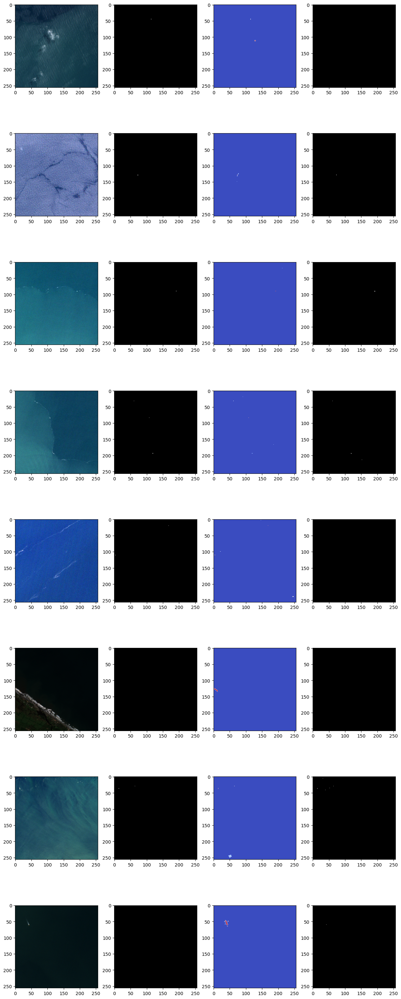

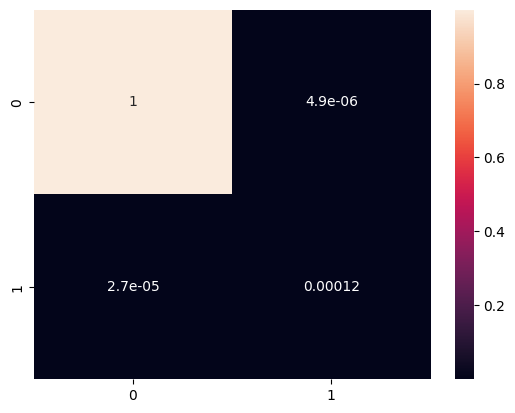

epoch 129/160: 100%|██████████| 53/53 [00:06<00:00,  8.57it/s, lr=8.14e-5, loss=0.214]  

epoch [129/160]: loss: 0.01495964


val_loss: nan, val_f1: 0.87781623, val_dice: 0.10417104, val_iou: 0.09523804, val_precision: 0.11757818, val_recall: 0.10958774


epoch 130/160: 100%|██████████| 53/53 [00:06<00:00,  8.56it/s, lr=7.66e-5, loss=0.0714] 

epoch [130/160]: loss: 0.01482149


val_loss: nan, val_f1: 0.87972014, val_dice: 0.10447470, val_iou: 0.09575723, val_precision: 0.11815708, val_recall: 0.10958774


epoch 131/160: 100%|██████████| 53/53 [00:06<00:00,  8.60it/s, lr=7.2e-5, loss=3.98e-6] 

epoch [131/160]: loss: 0.01477893


val_loss: nan, val_f1: 0.88096216, val_dice: 0.10470422, val_iou: 0.09623161, val_precision: 0.11956616, val_recall: 0.10887270


epoch 132/160: 100%|██████████| 53/53 [00:06<00:00,  8.60it/s, lr=6.75e-5, loss=0.0714] 

epoch [132/160]: loss: 0.01484656


val_loss: nan, val_f1: 0.87957532, val_dice: 0.10413751, val_iou: 0.09533561, val_precision: 0.11805703, val_recall: 0.10933978


epoch 133/160: 100%|██████████| 53/53 [00:06<00:00,  8.51it/s, lr=6.32e-5, loss=0.0727] 

epoch [133/160]: loss: 0.01484553


val_loss: nan, val_f1: 0.88431307, val_dice: 0.10500913, val_iou: 0.09674975, val_precision: 0.11955296, val_recall: 0.10940449


epoch 134/160: 100%|██████████| 53/53 [00:06<00:00,  8.50it/s, lr=5.9e-5, loss=0.0714]  

epoch [134/160]: loss: 0.01493986


val_loss: nan, val_f1: 0.87972427, val_dice: 0.10461043, val_iou: 0.09623675, val_precision: 0.11963788, val_recall: 0.10873368


epoch 135/160: 100%|██████████| 53/53 [00:06<00:00,  8.59it/s, lr=5.49e-5, loss=0.214]  

epoch [135/160]: loss: 0.01502819


val_loss: nan, val_f1: 0.87976434, val_dice: 0.10451114, val_iou: 0.09608598, val_precision: 0.11910302, val_recall: 0.10908387


epoch 136/160: 100%|██████████| 53/53 [00:06<00:00,  8.58it/s, lr=5.1e-5, loss=0.143]   

epoch [136/160]: loss: 0.01481804


val_loss: nan, val_f1: 0.87989677, val_dice: 0.10445322, val_iou: 0.09597891, val_precision: 0.11898052, val_recall: 0.10912020


epoch 137/160: 100%|██████████| 53/53 [00:06<00:00,  8.47it/s, lr=4.72e-5, loss=2.77e-6]

epoch [137/160]: loss: 0.01477954


val_loss: nan, val_f1: 0.88186212, val_dice: 0.10464790, val_iou: 0.09618822, val_precision: 0.11905196, val_recall: 0.10926235


epoch 138/160: 100%|██████████| 53/53 [00:06<00:00,  8.64it/s, lr=4.36e-5, loss=0.0714] 

epoch [138/160]: loss: 0.01489564


val_loss: nan, val_f1: 0.88175719, val_dice: 0.10469985, val_iou: 0.09642676, val_precision: 0.11945508, val_recall: 0.10912020


epoch 139/160: 100%|██████████| 53/53 [00:06<00:00,  8.60it/s, lr=4.01e-5, loss=3.14e-6]

epoch [139/160]: loss: 0.01484486


val_loss: nan, val_f1: 0.87323605, val_dice: 0.10304071, val_iou: 0.09373226, val_precision: 0.11686962, val_recall: 0.10880799


epoch 140/160: 100%|██████████| 53/53 [00:06<00:00,  8.53it/s, lr=3.68e-5, loss=2.72e-6]

epoch [140/160]: loss: 0.01492188


val_loss: nan, val_f1: 0.87865828, val_dice: 0.10421275, val_iou: 0.09552348, val_precision: 0.11919407, val_recall: 0.10859732


epoch 141/160: 100%|██████████| 53/53 [00:06<00:00,  8.57it/s, lr=3.37e-5, loss=0.0714] 

epoch [141/160]: loss: 0.01482350


val_loss: nan, val_f1: 0.87758759, val_dice: 0.10405709, val_iou: 0.09534090, val_precision: 0.11864451, val_recall: 0.10873947


epoch 142/160: 100%|██████████| 53/53 [00:06<00:00,  8.54it/s, lr=3.07e-5, loss=0.0714] 

epoch [142/160]: loss: 0.01512320


val_loss: nan, val_f1: 0.87722781, val_dice: 0.10405575, val_iou: 0.09526228, val_precision: 0.11905211, val_recall: 0.10838087


epoch 143/160: 100%|██████████| 53/53 [00:06<00:00,  8.62it/s, lr=2.78e-5, loss=0.0714] 

epoch [143/160]: loss: 0.01485910


val_loss: nan, val_f1: 0.87863189, val_dice: 0.10402135, val_iou: 0.09528409, val_precision: 0.11874681, val_recall: 0.10873947


epoch 144/160: 100%|██████████| 53/53 [00:06<00:00,  8.53it/s, lr=2.51e-5, loss=0.143]  

epoch [144/160]: loss: 0.01499164


val_loss: nan, val_f1: 0.87852761, val_dice: 0.10412743, val_iou: 0.09541671, val_precision: 0.11888823, val_recall: 0.10873947


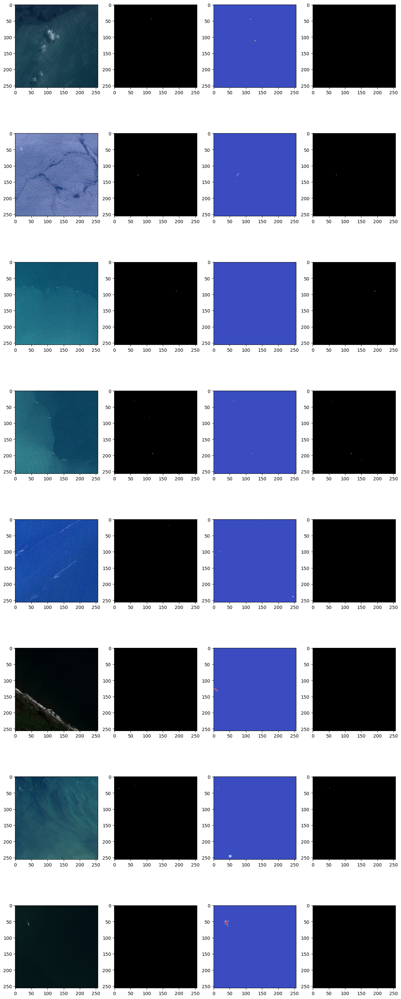

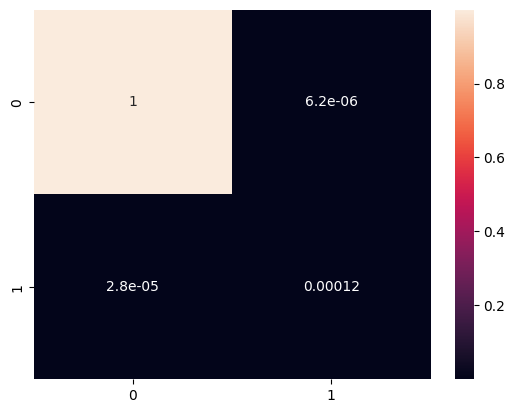

epoch 145/160: 100%|██████████| 53/53 [00:06<00:00,  8.58it/s, lr=2.26e-5, loss=0.0714] 

epoch [145/160]: loss: 0.01489188


val_loss: nan, val_f1: 0.88234399, val_dice: 0.10447386, val_iou: 0.09582017, val_precision: 0.11953879, val_recall: 0.10866517


epoch 146/160: 100%|██████████| 53/53 [00:06<00:00,  8.59it/s, lr=2.02e-5, loss=0.143]  

epoch [146/160]: loss: 0.01481800


val_loss: nan, val_f1: 0.87692262, val_dice: 0.10390524, val_iou: 0.09498945, val_precision: 0.11816926, val_recall: 0.10888162


epoch 147/160: 100%|██████████| 53/53 [00:06<00:00,  8.53it/s, lr=1.8e-5, loss=0.214]   

epoch [147/160]: loss: 0.01491999


val_loss: nan, val_f1: 0.87692262, val_dice: 0.10390524, val_iou: 0.09498945, val_precision: 0.11816926, val_recall: 0.10888162


epoch 148/160: 100%|██████████| 53/53 [00:06<00:00,  8.58it/s, lr=1.59e-5, loss=0.0714] 

epoch [148/160]: loss: 0.01479689


val_loss: nan, val_f1: 0.88148569, val_dice: 0.10439425, val_iou: 0.09583135, val_precision: 0.11948710, val_recall: 0.10873947


epoch 149/160: 100%|██████████| 53/53 [00:06<00:00,  8.58it/s, lr=1.4e-5, loss=0.214]   

epoch [149/160]: loss: 0.01483910


val_loss: nan, val_f1: 0.87697099, val_dice: 0.10407862, val_iou: 0.09534274, val_precision: 0.11867700, val_recall: 0.10873947


epoch 150/160: 100%|██████████| 53/53 [00:06<00:00,  8.67it/s, lr=1.23e-5, loss=3.2e-6] 

epoch [150/160]: loss: 0.01482645


val_loss: nan, val_f1: 0.87697099, val_dice: 0.10407862, val_iou: 0.09534274, val_precision: 0.11867700, val_recall: 0.10873947


epoch 151/160: 100%|██████████| 53/53 [00:06<00:00,  8.57it/s, lr=1.07e-5, loss=0.0714] 

epoch [151/160]: loss: 0.01480711


val_loss: nan, val_f1: 0.87827976, val_dice: 0.10419350, val_iou: 0.09547688, val_precision: 0.11869912, val_recall: 0.10888162


epoch 152/160: 100%|██████████| 53/53 [00:06<00:00,  8.66it/s, lr=9.32e-6, loss=0.432] 

epoch [152/160]: loss: 0.01507933


val_loss: nan, val_f1: 0.87896326, val_dice: 0.10420908, val_iou: 0.09554558, val_precision: 0.11903616, val_recall: 0.10873947


epoch 153/160: 100%|██████████| 53/53 [00:06<00:00,  8.63it/s, lr=8.07e-6, loss=0.214]  

epoch [153/160]: loss: 0.01488452


val_loss: nan, val_f1: 0.87771664, val_dice: 0.10414809, val_iou: 0.09547468, val_precision: 0.11882130, val_recall: 0.10873947


epoch 154/160: 100%|██████████| 53/53 [00:06<00:00,  8.63it/s, lr=6.99e-6, loss=0.0714] 

epoch [154/160]: loss: 0.01480295


val_loss: nan, val_f1: 0.87709049, val_dice: 0.10407090, val_iou: 0.09533618, val_precision: 0.11867818, val_recall: 0.10873947


epoch 155/160: 100%|██████████| 53/53 [00:06<00:00,  8.57it/s, lr=6.08e-6, loss=0.214]  

epoch [155/160]: loss: 0.01495843


val_loss: nan, val_f1: 0.87862505, val_dice: 0.10411837, val_iou: 0.09540552, val_precision: 0.11888456, val_recall: 0.10873947


epoch 156/160: 100%|██████████| 53/53 [00:06<00:00,  8.62it/s, lr=5.33e-6, loss=3.2e-6] 

epoch [156/160]: loss: 0.01492940


val_loss: nan, val_f1: 0.87728169, val_dice: 0.10406266, val_iou: 0.09536471, val_precision: 0.11913777, val_recall: 0.10836503


epoch 157/160: 100%|██████████| 53/53 [00:06<00:00,  8.63it/s, lr=4.75e-6, loss=0.143]  

epoch [157/160]: loss: 0.01482078


val_loss: nan, val_f1: 0.87834371, val_dice: 0.10429922, val_iou: 0.09574392, val_precision: 0.11957907, val_recall: 0.10836503


epoch 158/160: 100%|██████████| 53/53 [00:06<00:00,  8.59it/s, lr=4.33e-6, loss=0.0714] 

epoch [158/160]: loss: 0.01481799


val_loss: nan, val_f1: 0.87934014, val_dice: 0.10437150, val_iou: 0.09580235, val_precision: 0.11949832, val_recall: 0.10850718


epoch 159/160: 100%|██████████| 53/53 [00:06<00:00,  8.62it/s, lr=4.08e-6, loss=0.143]  

epoch [159/160]: loss: 0.01485458


val_loss: nan, val_f1: 0.87741855, val_dice: 0.10417675, val_iou: 0.09552780, val_precision: 0.11933688, val_recall: 0.10836503


epoch 160/160: 100%|██████████| 53/53 [00:06<00:00,  8.60it/s, lr=4e-6, loss=0.214]     

epoch [160/160]: loss: 0.01501311


val_loss: nan, val_f1: 0.87871812, val_dice: 0.10429431, val_iou: 0.09566385, val_precision: 0.11935520, val_recall: 0.10850718


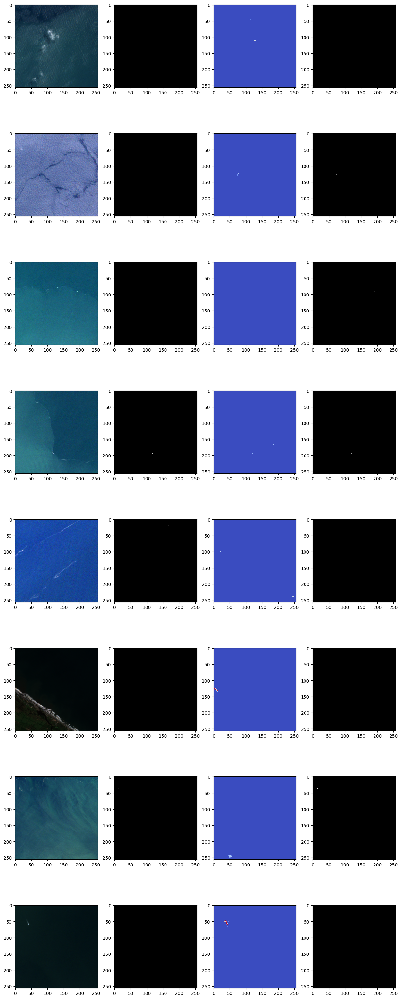

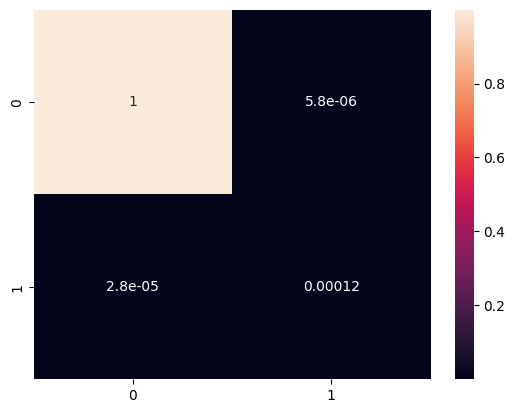

In [56]:
train_loss_hist, val_loss_hist = [], []
train_acc_hist, val_acc_hist = [], []

step = 1
for epoch in range(1, epochs + 1):
    model.train()
    train_loss = 0.0
    train_weighted_correct = 0.0
    train_total_weight = 0.0
    pb = tqdm(train_loader, desc=f"epoch {epoch}/{epochs}")
    for images, targets, _ in pb:
        images, targets = images.to(device), targets.to(device)
        images = torch.where(torch.isfinite(images), images, torch.zeros_like(images))
        assert torch.all(torch.isfinite(images)), "Input images contain NaN or infinite values."
        assert torch.all(torch.isfinite(targets)), "Target labels contain NaN or infinite values."
        recon = model(images)
        bs = images.size(0)
        loss = criterion(recon, targets.long())
        # print(loss)
        optimizer.zero_grad()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1)
        optimizer.step()
        scheduler.step()

        with torch.no_grad():
            correct = (recon.argmax(1) == targets)
            weights_per_sample = original_weights[targets.long()]
            batch_weighted_correct = (correct.float() * weights_per_sample).sum().item()
            batch_total_weight = weights_per_sample.sum().item()
        
        train_loss += loss.item()
        train_weighted_correct += batch_weighted_correct
        train_total_weight += batch_total_weight
        
        train_loss_hist.append(loss.item())
        if batch_total_weight > 0:
            train_acc_hist.append(batch_weighted_correct / batch_total_weight)
        else:
            train_acc_hist.append(0.0)

        pb.set_postfix({"lr":scheduler.get_last_lr()[0], "loss":loss.item()})



    
    train_loss /= len(train_loader.dataset)
    train_acc = train_weighted_correct / train_total_weight if train_total_weight > 0 else 0.0

    print(f"epoch [{epoch}/{epochs}]: loss: {train_loss:.8f}")
    # print(f"f1: {f1:.8f}, val_dice: {dice:.8f}, val_iou: {iou:.8f}, val_precision: {precision:.8f}, val_recall: {recall:.8f}")

    with torch.no_grad():
        conf_matrix = np.zeros((2, 2))
        iou = precision = recall = f1 = dice = val_loss = 0
        for images, targets, _ in test_loader:
            images, targets = images.to(device), targets.to(device)

            recon = model(images)
            val_loss += criterion(recon, targets.long()).item()

            recon = (recon.argmax(1) == 1).float()

            intersection = (recon * targets).sum().item()
            union = recon.sum().item() + targets.sum().item() - intersection

            iou += intersection / union if union else 1
            precision += intersection / recon.sum().item() if recon.sum().item() else 1
            recall += intersection / targets.sum().item() if targets.sum().item() else 1
            f1 += 2 * precision * recall / (precision + recall) if precision + recall else 1
            dice += 2 * intersection / (recon.sum().item() + targets.sum().item() + 1e-6) if (targets.sum().item() or recon.sum().item()) else 1
            y_true = targets.cpu().numpy().flatten()
            y_pred = recon.long().cpu().numpy().flatten()
            # print(y_pred.shape, y_true.shape)
            conf_matrix += confusion_matrix(y_true, y_pred)

        iou /= len(test_loader.dataset)
        precision /= len(test_loader.dataset)
        recall /= len(test_loader.dataset)
        f1 /= len(test_loader.dataset)
        dice /= len(test_loader.dataset)
        val_loss /= len(test_loader.dataset)
    
    print(f"val_loss: {val_loss}, val_f1: {f1:.8f}, val_dice: {dice:.8f}, val_iou: {iou:.8f}, val_precision: {precision:.8f}, val_recall: {recall:.8f}")

    if epoch % int(epochs//10) == 0:
        a = 8
        i = 0
        fig, axis = plt.subplots(8, 4, figsize=(15, 40))
        for idx in range(a, a+8):
            img, msk, cnf = test_dataset[idx]
            
            rgb_img = np.dstack((img[3], img[2], img[1]))    
            rgb_img = (rgb_img - rgb_img.min())/(rgb_img.max() - rgb_img.min())
            with torch.no_grad():
                pred = model(torch.tensor(img, dtype=torch.float32, device=device).unsqueeze(0)).argmax(1)[0].cpu().numpy()
            
            axis[i, 0].imshow(rgb_img)
            axis[i, 1].imshow(msk, cmap="gray")
            axis[i, 2].imshow(cnf, cmap="coolwarm")
            axis[i, 3].imshow(pred, cmap="gray")
            # print(np.unique(pred, return_counts=True))
            i += 1
        plt.show()
        sns.heatmap(conf_matrix/conf_matrix.sum(), annot=True)
        plt.show()

In [57]:
torch.save(model.state_dict(), "checkpoint.pth")